# Importing Required Libraries

In [261]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier,NearestNeighbors
import xgboost as xgb
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
from collections import Counter
import lightgbm as lgb
from imblearn.combine import SMOTETomek
from sklearn.model_selection import RandomizedSearchCV
plt.style.use ("dark_background")

# Loading Data to model

In [112]:
dataset = pd.read_excel('Z-Alizadeh sani dataset.xlsx')
dataset

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,Cad
1,67,70,157,Fmale,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,Cad
3,66,67,158,Fmale,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,Normal
4,50,87,153,Fmale,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,Male,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,N,Cad
299,55,64,152,Fmale,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,mild,Normal
300,48,77,160,Fmale,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,N,Normal
301,57,90,159,Fmale,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,N,Normal


In [113]:
dataset.shape

(303, 56)

In [114]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 56 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    303 non-null    int64  
 1   Weight                 303 non-null    int64  
 2   Length                 303 non-null    int64  
 3   Sex                    303 non-null    object 
 4   BMI                    303 non-null    float64
 5   DM                     303 non-null    int64  
 6   HTN                    303 non-null    int64  
 7   Current Smoker         303 non-null    int64  
 8   EX-Smoker              303 non-null    int64  
 9   FH                     303 non-null    int64  
 10  Obesity                303 non-null    object 
 11  CRF                    303 non-null    object 
 12  CVA                    303 non-null    object 
 13  Airway disease         303 non-null    object 
 14  Thyroid Disease        303 non-null    object 
 15  CHF   

In [115]:
dataset.isna().sum()

Age                      0
Weight                   0
Length                   0
Sex                      0
BMI                      0
DM                       0
HTN                      0
Current Smoker           0
EX-Smoker                0
FH                       0
Obesity                  0
CRF                      0
CVA                      0
Airway disease           0
Thyroid Disease          0
CHF                      0
DLP                      0
BP                       0
PR                       0
Edema                    0
Weak Peripheral Pulse    0
Lung rales               0
Systolic Murmur          0
Diastolic Murmur         0
Typical Chest Pain       0
Dyspnea                  0
Function Class           0
Atypical                 0
Nonanginal               0
Exertional CP            0
LowTH Ang                0
Q Wave                   0
St Elevation             0
St Depression            0
Tinversion               0
LVH                      0
Poor R Progression       0
B

<Axes: >

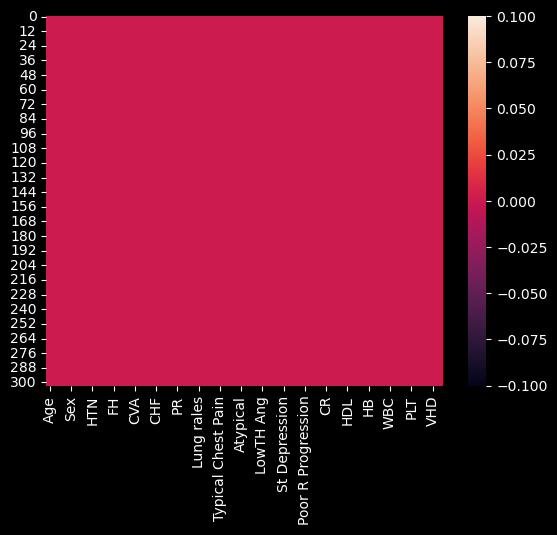

In [116]:
sns.heatmap(dataset.isna())

In [117]:
dataset.describe()

,Age,Weight,Length,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,BP,...,ESR,HB,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,...,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,58.897690,73.831683,164.716172,27.248339,0.297030,0.590759,0.207921,0.033003,0.158416,129.554455,...,19.462046,13.153465,4.230693,140.996700,7562.046205,32.399340,60.148515,221.488449,47.231023,0.620462
std,10.392278,11.987358,9.327661,4.098865,0.457706,0.492507,0.406491,0.178941,0.365734,18.938105,...,15.936475,1.610452,0.458202,3.807885,2413.739323,9.972592,10.182493,60.796199,8.927194,1.132531
min,30.000000,48.000000,140.000000,18.115413,0.000000,0.000000,0.000000,0.000000,0.000000,90.000000,...,1.000000,8.900000,3.000000,128.000000,3700.000000,7.000000,32.000000,25.000000,15.000000,0.000000
25%,51.000000,65.000000,158.000000,24.514380,0.000000,0.000000,0.000000,0.000000,0.000000,120.000000,...,9.000000,12.200000,3.900000,139.000000,5800.000000,26.000000,52.500000,183.500000,45.000000,0.000000
50%,58.000000,74.000000,165.000000,26.775510,0.000000,1.000000,0.000000,0.000000,0.000000,130.000000,...,15.000000,13.200000,4.200000,141.000000,7100.000000,32.000000,60.000000,210.000000,50.000000,0.000000
75%,66.000000,81.000000,171.000000,29.411765,1.000000,1.000000,0.000000,0.000000,0.000000,140.000000,...,26.000000,14.200000,4.500000,143.000000,8800.000000,39.000000,67.000000,250.000000,55.000000,1.000000
max,86.000000,120.000000,188.000000,40.900658,1.000000,1.000000,1.000000,1.000000,1.000000,190.000000,...,90.000000,17.600000,6.600000,156.000000,18000.000000,60.000000,89.000000,742.000000,60.000000,4.000000


<Axes: >

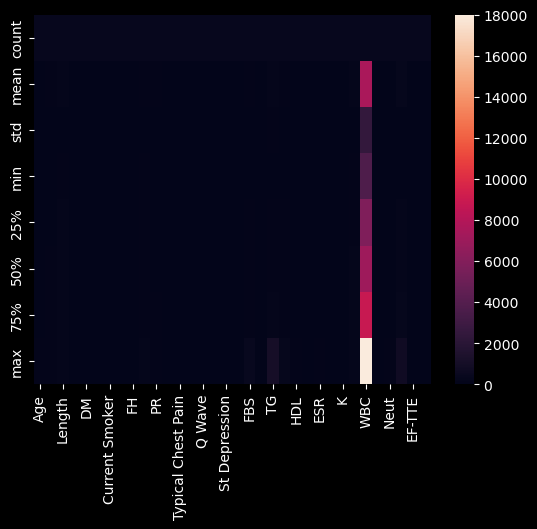

In [118]:
sns.heatmap(dataset.describe())

In [119]:
dataset.corr()

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2191645083.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataset.corr()


,Age,Weight,Length,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,BP,...,ESR,HB,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA
Age,1.000000,-0.264585,-0.163753,-0.161414,0.072543,0.246690,-0.143879,0.076608,-0.183900,0.215527,...,0.183127,-0.161018,0.154203,-0.071886,0.020398,-0.171529,0.173030,-0.049500,-0.140512,0.108663
Weight,-0.264585,1.000000,0.460631,0.725005,-0.003531,-0.028532,0.157385,0.068977,0.021963,-0.025930,...,-0.139314,0.274218,-0.018287,0.013916,-0.020214,0.020120,-0.051093,-0.094192,0.026789,-0.007648
Length,-0.163753,0.460631,1.000000,-0.269356,-0.052318,-0.153668,0.335248,0.079034,0.004488,-0.072511,...,-0.222182,0.341028,-0.086277,-0.066590,0.066658,-0.156436,0.115075,-0.133446,-0.093295,0.095715
BMI,-0.161414,0.725005,-0.269356,1.000000,0.045360,0.091652,-0.089398,0.005016,0.014045,0.031916,...,0.023259,0.031107,0.044587,0.067402,-0.074928,0.139583,-0.140037,-0.003964,0.093903,-0.079739
DM,0.072543,-0.003531,-0.052318,0.045360,1.000000,0.217864,-0.208458,-0.120087,-0.064434,0.128010,...,0.190397,-0.156382,0.100064,-0.083030,0.110345,0.033413,-0.024417,0.051054,-0.052507,0.064891
HTN,0.246690,-0.028532,-0.153668,0.091652,0.217864,1.000000,-0.169000,0.041045,-0.098467,0.570418,...,0.161704,-0.115935,0.011826,0.036355,-0.069374,0.017204,-0.025476,-0.043840,0.031365,-0.000372
Current Smoker,-0.143879,0.157385,0.335248,-0.089398,-0.208458,-0.169000,1.000000,-0.094652,0.089532,-0.079115,...,-0.121199,0.216144,-0.016599,0.036812,0.046205,-0.053224,0.042115,-0.048473,-0.068943,0.078479
EX-Smoker,0.076608,0.068977,0.079034,0.005016,-0.120087,0.041045,-0.094652,1.000000,-0.080152,0.028781,...,0.017858,-0.024528,-0.004318,-0.038716,-0.057655,0.070524,-0.068122,-0.079102,-0.015153,0.012996
FH,-0.183900,0.021963,0.004488,0.014045,-0.064434,-0.098467,0.089532,-0.080152,1.000000,-0.082999,...,-0.061457,-0.045348,-0.017255,-0.113749,0.067973,-0.014679,0.040786,-0.023000,0.089157,-0.038230
BP,0.215527,-0.025930,-0.072511,0.031916,0.128010,0.570418,-0.079115,0.028781,-0.082999,1.000000,...,0.036155,-0.129196,0.033902,0.067064,-0.071686,-0.005244,-0.007812,-0.092516,-0.047472,0.024047


C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\3249925955.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dataset.corr())
C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\3249925955.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  top_corr_features = dataset.corr().index


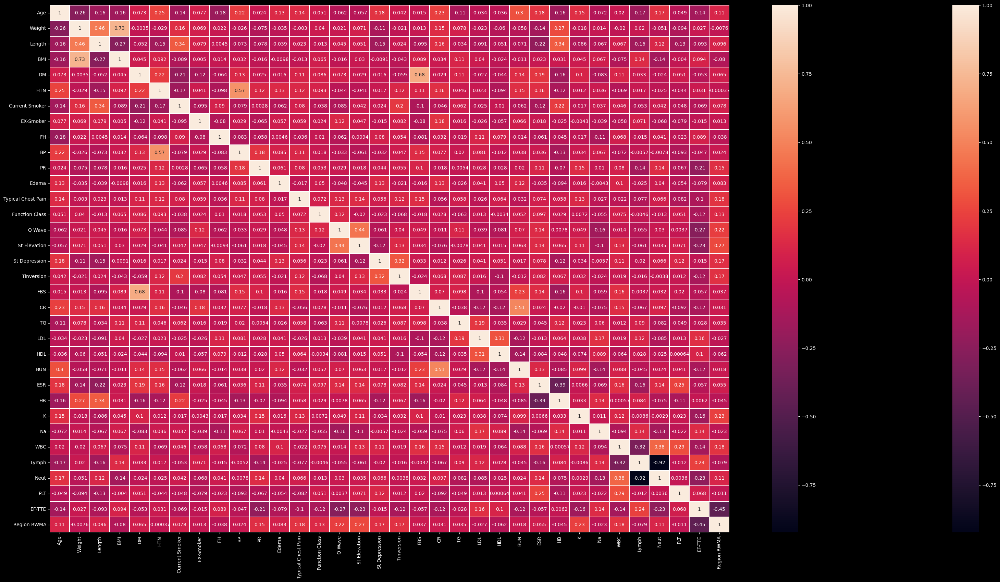

In [120]:
plt.figure(figsize=(40, 20))
sns.heatmap(dataset.corr())
top_corr_features = dataset.corr().index
g=sns.heatmap(dataset[top_corr_features].corr(),annot=True,linewidth=.10,cmap="rocket")

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2397469981.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  matrix = np.triu(dataset.corr())
C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2397469981.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");


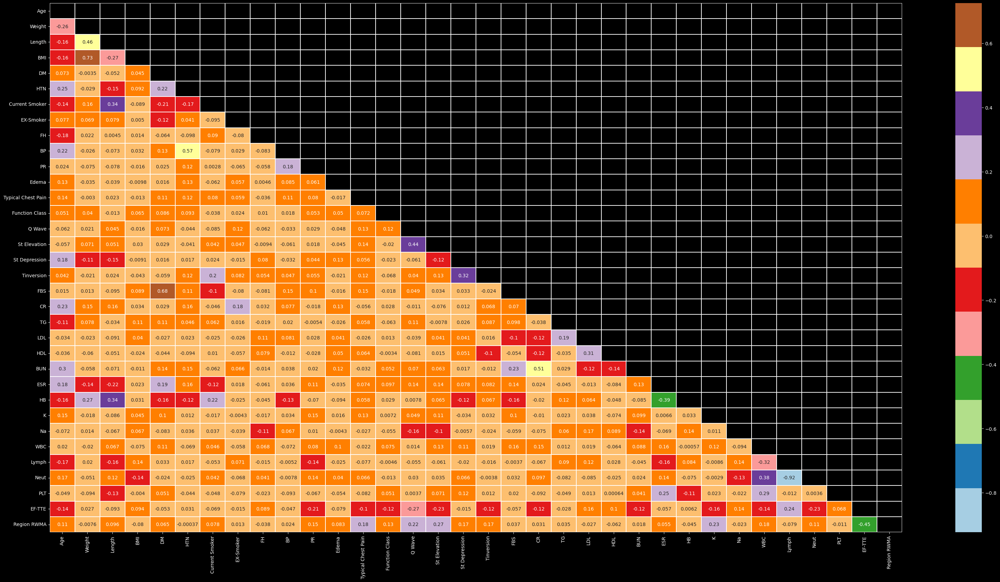

In [121]:
plt.figure(figsize=(40, 20))
matrix = np.triu(dataset.corr())
sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\3055010306.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.histplot(data=dataset.corr(),kde=True,palette='hot')


<Axes: ylabel='Count'>

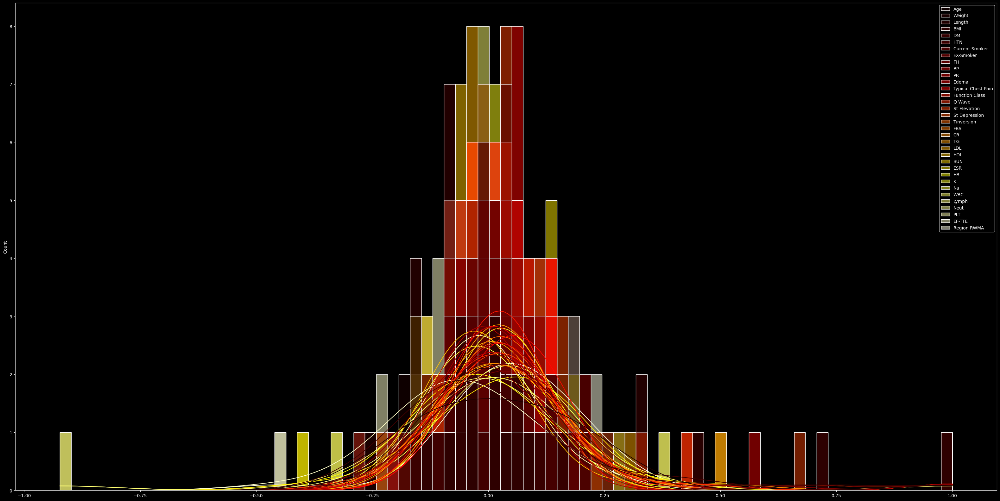

In [122]:
plt.figure(figsize=(40, 20))
sns.histplot(data=dataset.corr(),kde=True,palette='hot')

In [123]:
dataset.nunique()

Age                       46
Weight                    54
Length                    44
Sex                        2
BMI                      263
DM                         2
HTN                        2
Current Smoker             2
EX-Smoker                  2
FH                         2
Obesity                    2
CRF                        2
CVA                        2
Airway disease             2
Thyroid Disease            2
CHF                        2
DLP                        2
BP                        17
PR                        21
Edema                      2
Weak Peripheral Pulse      2
Lung rales                 2
Systolic Murmur            2
Diastolic Murmur           2
Typical Chest Pain         2
Dyspnea                    2
Function Class             4
Atypical                   2
Nonanginal                 2
Exertional CP              1
LowTH Ang                  2
Q Wave                     2
St Elevation               2
St Depression              2
Tinversion    

In [124]:
# data cleaning: fixing column names

dataset = dataset.rename(columns={'Age': 'age', 'Weight': 'weight', 'Length': 'height', 'Sex': 'sex', 'Current Smoker': 'current_smoker',
                       'EX-Smoker': 'ex_smoker','FH': 'family_history', 'Obesity': 'obesity', 'CRF': 'chronic_renal_failure',
                       'CVA': 'cerebrovascular_accident', 'Airway disease': 'airway_disease', 'Thyroid Disease': 'thyroid_disease',
                       'CHF': 'congestive_heart_failure', 'DLP': 'dyslipidemia', 'Edema': 'edema', 'Weak Peripheral Pulse': 'weak_peripheral_pulse',
                       'Lung rales': 'lung_rales', 'Systolic Murmur': 'systolic_murmur', 'Diastolic Murmur': 'diastolic_murmur',
                        'Typical Chest Pain': 'typical_chest_pain', 'Dyspnea': 'dyspnea', 'Function Class': 'function_class', 'Atypical': 'atypical',
                        'Nonanginal': 'non_anginal', 'Exertional CP': 'exertional_chest_pain', 'LowTH Ang': 'low_threshold_angina', 'Q Wave': 'q_wave',
                        'St Elevation': 'st_elevation', 'St Depression': 'st_depression', 'Tinversion': 'tinversion', 'Poor R Progression': 'poor_r_progression',
                        'EF-TTE': 'ejection_fraction', 'Region RWMA': 'region_RWMA' , 'Cath': 'target' })

In [125]:
# Loop over all columns
for col in dataset.columns:
    unique_values = dataset[col].unique()
    unique_count = len(unique_values)
    
    if unique_count < 10:
        print(f"Unique values in '{col}': {unique_values}")
    else:
        print(f"Unique value count in '{col}': {unique_count}")

Unique value count in 'age': 46
Unique value count in 'weight': 54
Unique value count in 'height': 44
Unique values in 'sex': ['Male' 'Fmale']
Unique value count in 'BMI': 263
Unique values in 'DM': [0 1]
Unique values in 'HTN': [1 0]
Unique values in 'current_smoker': [1 0]
Unique values in 'ex_smoker': [0 1]
Unique values in 'family_history': [0 1]
Unique values in 'obesity': ['Y' 'N']
Unique values in 'chronic_renal_failure': ['N' 'Y']
Unique values in 'cerebrovascular_accident': ['N' 'Y']
Unique values in 'airway_disease': ['N' 'Y']
Unique values in 'thyroid_disease': ['N' 'Y']
Unique values in 'congestive_heart_failure': ['N' 'Y']
Unique values in 'dyslipidemia': ['Y' 'N']
Unique value count in 'BP': 17
Unique value count in 'PR': 21
Unique values in 'edema': [0 1]
Unique values in 'weak_peripheral_pulse': ['N' 'Y']
Unique values in 'lung_rales': ['N' 'Y']
Unique values in 'systolic_murmur': ['N' 'Y']
Unique values in 'diastolic_murmur': ['N' 'Y']
Unique values in 'typical_chest_p

In [126]:
# Define replacement values for each column
replacement_values = {'sex': {'Male': 0, 'Fmale': 1},'obesity': {'Y': 1, 'N': 0}, 'chronic_renal_failure': {'Y': 1, 'N': 0},
                      'cerebrovascular_accident': {'Y': 1, 'N': 0},'airway_disease': {'Y': 1, 'N': 0},
                      'thyroid_disease': {'Y': 1, 'N': 0},'congestive_heart_failure': {'Y': 1, 'N': 0},
                      'dyslipidemia': {'Y': 1, 'N': 0},'weak_peripheral_pulse': {'Y': 1, 'N': 0},
                      'lung_rales': {'Y': 1, 'N': 0},'systolic_murmur': {'Y': 1, 'N': 0},'diastolic_murmur': {'Y': 1, 'N': 0},
                      'dyspnea': {'Y': 1, 'N': 0},'atypical': {'Y': 1, 'N': 0},'non_anginal': {'Y': 1, 'N': 0},
                      'exertional_chest_pain': {'Y': 1, 'N': 0},'low_threshold_angina': {'Y': 1, 'N': 0},
                      'LVH': {'Y': 1, 'N': 0},'poor_r_progression': {'Y': 1, 'N': 0}, 'target': {'Cad': 1, 'Normal': 0}, 
                     }

# Replace values in multiple columns
dataset.replace(replacement_values, inplace=True)


In [127]:
# Loop over all columns
for col in dataset.columns:
    unique_values = dataset[col].unique()
    unique_count = len(unique_values)
    
    if unique_count < 10:
        print(f"Unique values in '{col}': {unique_values}")
    else:
        print(f"Unique value count in '{col}': {unique_count}")

Unique value count in 'age': 46
Unique value count in 'weight': 54
Unique value count in 'height': 44
Unique values in 'sex': [0 1]
Unique value count in 'BMI': 263
Unique values in 'DM': [0 1]
Unique values in 'HTN': [1 0]
Unique values in 'current_smoker': [1 0]
Unique values in 'ex_smoker': [0 1]
Unique values in 'family_history': [0 1]
Unique values in 'obesity': [1 0]
Unique values in 'chronic_renal_failure': [0 1]
Unique values in 'cerebrovascular_accident': [0 1]
Unique values in 'airway_disease': [0 1]
Unique values in 'thyroid_disease': [0 1]
Unique values in 'congestive_heart_failure': [0 1]
Unique values in 'dyslipidemia': [1 0]
Unique value count in 'BP': 17
Unique value count in 'PR': 21
Unique values in 'edema': [0 1]
Unique values in 'weak_peripheral_pulse': [0 1]
Unique values in 'lung_rales': [0 1]
Unique values in 'systolic_murmur': [0 1]
Unique values in 'diastolic_murmur': [0 1]
Unique values in 'typical_chest_pain': [0 1]
Unique values in 'dyspnea': [0 1]
Unique va

In [128]:
dataset.head(10)

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53,90,175,0,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,1
1,67,70,157,1,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,1
2,54,54,164,0,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,1
3,66,67,158,1,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,0
4,50,87,153,1,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,0
5,50,75,175,0,24.489796,0,0,1,0,0,...,4.2,141,7300,26,66,194,50,0,N,1
6,55,80,165,0,29.384757,0,0,0,1,0,...,4.8,139,9400,58,33,292,40,4,mild,1
7,72,80,175,0,26.122449,1,0,1,0,0,...,4.3,142,12200,25,74,410,45,4,mild,1
8,58,84,163,1,31.615793,0,0,0,0,0,...,3.4,139,5100,49,50,370,50,0,N,0
9,60,71,170,0,24.567474,1,0,0,0,0,...,4.6,140,4900,55,42,380,40,2,N,1


In [129]:
dataset.nunique()

age                          46
weight                       54
height                       44
sex                           2
BMI                         263
DM                            2
HTN                           2
current_smoker                2
ex_smoker                     2
family_history                2
obesity                       2
chronic_renal_failure         2
cerebrovascular_accident      2
airway_disease                2
thyroid_disease               2
congestive_heart_failure      2
dyslipidemia                  2
BP                           17
PR                           21
edema                         2
weak_peripheral_pulse         2
lung_rales                    2
systolic_murmur               2
diastolic_murmur              2
typical_chest_pain            2
dyspnea                       2
function_class                4
atypical                      2
non_anginal                   2
exertional_chest_pain         1
low_threshold_angina          2
q_wave  

In [130]:
# Splitting features into categorical features and continuous features for plotting

# Continuous Features
continuous_cols = ['age', 'weight', 'height','BMI', 'BP', 'PR', 
                   'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC',
            'Lymph', 'Neut', 'PLT', 'ejection_fraction']

# Categorical variables:
cat_cols = ['DM', 'HTN' , 'current_smoker' , 'ex_smoker' ,'family_history' , 'obesity' ,
            'chronic_renal_failure', 'cerebrovascular_accident' , 'airway_disease' ,
            'thyroid_disease ','congestive_heart_failure ' , 'dyslipidemia' , 'edema' ,
            'weak_peripheral_pulse' , 'lung_rales' , 'systolic_murmur', 'diastolic_murmur',
            'typical_chest_pain' , 'dyspnea' , 'function_class' , 'atypical' , 'non_anginal',
            'exertional_chest_pain' , 'low_threshold_angina' , 'q_wave' ,  'st_elevation'  ,
            'st_depression' , 'tinversion' , 'LVH' , 'poor_r_progression' , 'BBB' , 'region_RWMA',
            'VHD' , 'target']

In [131]:
# Making sure I did not forget any feature
dataset.shape[1] == (len(continuous_cols) + len(cat_cols))

False

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2828749904.py:30: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


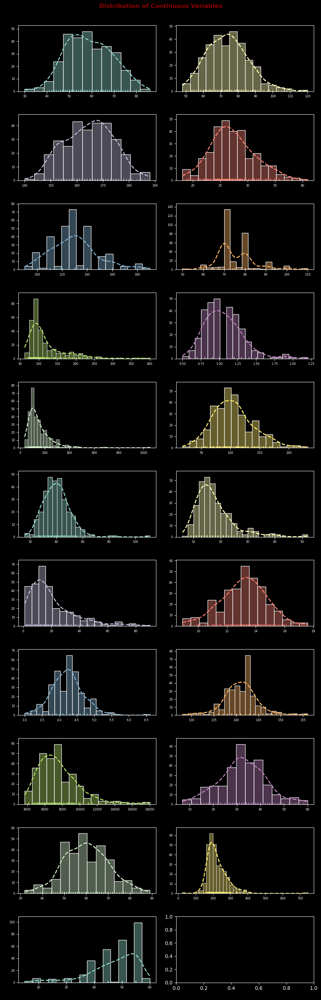

In [132]:
# Creating Subplots
fig,axes = plt.subplots(nrows = 11, ncols = 2, figsize = (9, 30))
axes = axes.flat

color_cycle = list(plt.rcParams['axes.prop_cycle'])
num_colors = len(color_cycle)

for i, num_col in enumerate(continuous_cols):
    sns.histplot(dataset,
               x = num_col,
               stat = 'count',
               kde = True,
               color = color_cycle[i % num_colors]["color"],
               line_kws = {'linewidth': 2,
                           'linestyle':'dashed'},
               alpha = 0.4,
               ax = axes[i])
    sns.rugplot(dataset,
              x = num_col,
              color = color_cycle[i % num_colors]["color"],
              ax = axes[i], alpha = 0.7)
    axes[i].set_xlabel(" ")
    axes[i].set_ylabel("Count", fontsize = 7, fontweight = 'bold', color = 'black')
    axes[i].set_title(num_col, fontsize = 8, fontweight = 'bold', color = 'black')
    axes[i].tick_params(labelsize = 6)

fig.suptitle('Distribution of Continuous Variables', fontsize = 12, fontweight = 'bold', color = 'darkred', y = 0.92)
fig.tight_layout()
fig.subplots_adjust(top = 0.9)
fig.show()

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2397469981.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  matrix = np.triu(dataset.corr())
C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\2397469981.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");


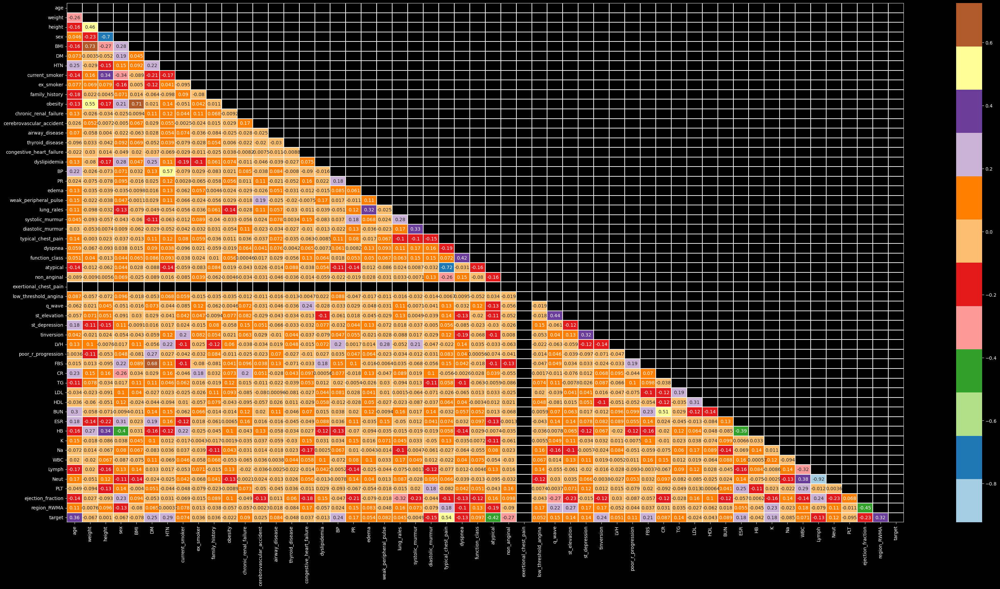

In [133]:
plt.figure(figsize=(40, 20))
matrix = np.triu(dataset.corr())
sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");

In [134]:
from scipy.stats import chi2_contingency

def chi_square_test(variables, X_df, label_df):
    label_df = pd.DataFrame(label_df, columns = ['target'])
    for column in variables:
            ct = pd.crosstab(index = X_df[column], columns = label_df['target']).reset_index().rename(columns={0:'Normal', 1:'CAD'})
            ct = ct.drop(columns = column)
            stat, p, dof, expected = chi2_contingency(ct)
            # interpret p-value
            alpha = 0.05
            print("p value is {}".format(p))
            if p <= alpha:
                print('{} and the target are dependent (reject H0)'.format(column))
            else:
                print('{} and the target are independent (H0 holds true)'.format(column))


In [135]:
chi_square_test(cat_cols, dataset, dataset)

p value is 2.0151216696088066e-05
DM and the target are dependent (reject H0)
p value is 1.0613994174234381e-06
HTN and the target are dependent (reject H0)
p value is 0.2614282408056519
current_smoker and the target are independent (H0 holds true)
p value is 0.7918503571878034
ex_smoker and the target are independent (H0 holds true)
p value is 0.6556712220589083
family_history and the target are independent (H0 holds true)
p value is 0.8003392662047962
obesity and the target are independent (H0 holds true)
p value is 0.2650767356538259
chronic_renal_failure and the target are independent (H0 holds true)
p value is 1.0
cerebrovascular_accident and the target are independent (H0 holds true)
p value is 0.2602261868983113
airway_disease and the target are independent (H0 holds true)


KeyError: 'thyroid_disease '

# drop irrelevant data

In [137]:
dataset.drop(['exertional_chest_pain'], axis=1, inplace=True)
dataset

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53,90,175,0,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,1
1,67,70,157,1,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,1
2,54,54,164,0,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,1
3,66,67,158,1,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,0
4,50,87,153,1,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,0,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,N,1
299,55,64,152,1,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,mild,0
300,48,77,160,1,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,N,0
301,57,90,159,1,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,N,0


In [138]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       303 non-null    int64  
 1   weight                    303 non-null    int64  
 2   height                    303 non-null    int64  
 3   sex                       303 non-null    int64  
 4   BMI                       303 non-null    float64
 5   DM                        303 non-null    int64  
 6   HTN                       303 non-null    int64  
 7   current_smoker            303 non-null    int64  
 8   ex_smoker                 303 non-null    int64  
 9   family_history            303 non-null    int64  
 10  obesity                   303 non-null    int64  
 11  chronic_renal_failure     303 non-null    int64  
 12  cerebrovascular_accident  303 non-null    int64  
 13  airway_disease            303 non-null    int64  
 14  thyroid_di

# Making histogram to show frequency of Target

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\4291194072.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=dataset['target'],kde=True,palette='hot')


<Axes: xlabel='target', ylabel='Count'>

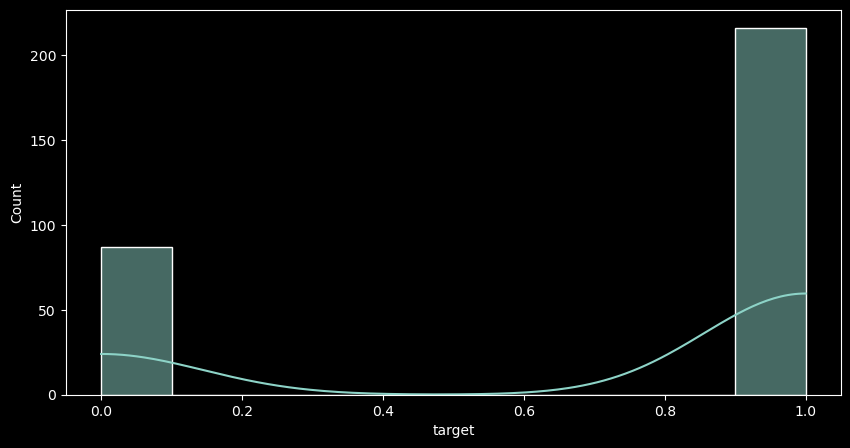

In [139]:
plt.figure(figsize=(10,5))
sns.histplot(data=dataset['target'],kde=True,palette='hot')

# Encoding Dataset

In [140]:
LE = LabelEncoder()
dataset['BBB'] = LE.fit_transform(dataset['BBB'])
dataset['VHD'] = LE.fit_transform(dataset['VHD'])
dataset

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53,90,175,0,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,1,1
1,67,70,157,1,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,1,1
2,54,54,164,0,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,3,1
3,66,67,158,1,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,2,0
4,50,87,153,1,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,0,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,1,1
299,55,64,152,1,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,3,0
300,48,77,160,1,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,1,0
301,57,90,159,1,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,1,0


In [141]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       303 non-null    int64  
 1   weight                    303 non-null    int64  
 2   height                    303 non-null    int64  
 3   sex                       303 non-null    int64  
 4   BMI                       303 non-null    float64
 5   DM                        303 non-null    int64  
 6   HTN                       303 non-null    int64  
 7   current_smoker            303 non-null    int64  
 8   ex_smoker                 303 non-null    int64  
 9   family_history            303 non-null    int64  
 10  obesity                   303 non-null    int64  
 11  chronic_renal_failure     303 non-null    int64  
 12  cerebrovascular_accident  303 non-null    int64  
 13  airway_disease            303 non-null    int64  
 14  thyroid_di

In [142]:
dataset.describe()

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,...,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,58.897690,73.831683,164.716172,0.419142,27.248339,0.297030,0.590759,0.207921,0.033003,0.158416,...,4.230693,140.996700,7562.046205,32.399340,60.148515,221.488449,47.231023,0.620462,1.930693,0.712871
std,10.392278,11.987358,9.327661,0.494235,4.098865,0.457706,0.492507,0.406491,0.178941,0.365734,...,0.458202,3.807885,2413.739323,9.972592,10.182493,60.796199,8.927194,1.132531,1.109180,0.453171
min,30.000000,48.000000,140.000000,0.000000,18.115413,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,128.000000,3700.000000,7.000000,32.000000,25.000000,15.000000,0.000000,0.000000,0.000000
25%,51.000000,65.000000,158.000000,0.000000,24.514380,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.900000,139.000000,5800.000000,26.000000,52.500000,183.500000,45.000000,0.000000,1.000000,0.000000
50%,58.000000,74.000000,165.000000,0.000000,26.775510,0.000000,1.000000,0.000000,0.000000,0.000000,...,4.200000,141.000000,7100.000000,32.000000,60.000000,210.000000,50.000000,0.000000,2.000000,1.000000
75%,66.000000,81.000000,171.000000,1.000000,29.411765,1.000000,1.000000,0.000000,0.000000,0.000000,...,4.500000,143.000000,8800.000000,39.000000,67.000000,250.000000,55.000000,1.000000,3.000000,1.000000
max,86.000000,120.000000,188.000000,1.000000,40.900658,1.000000,1.000000,1.000000,1.000000,1.000000,...,6.600000,156.000000,18000.000000,60.000000,89.000000,742.000000,60.000000,4.000000,3.000000,1.000000


<Axes: >

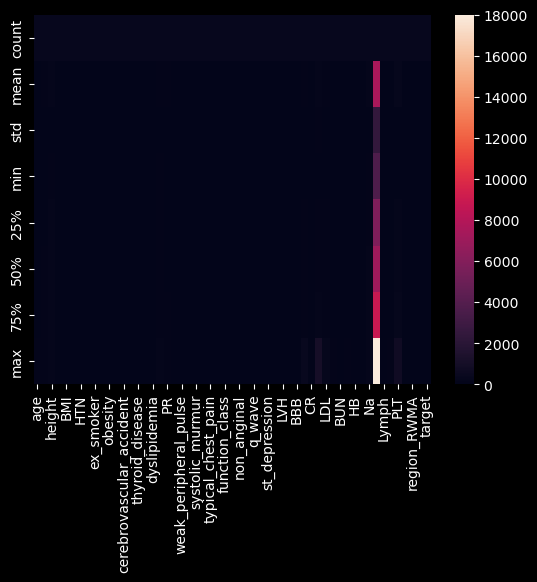

In [143]:
sns.heatmap(dataset.describe())

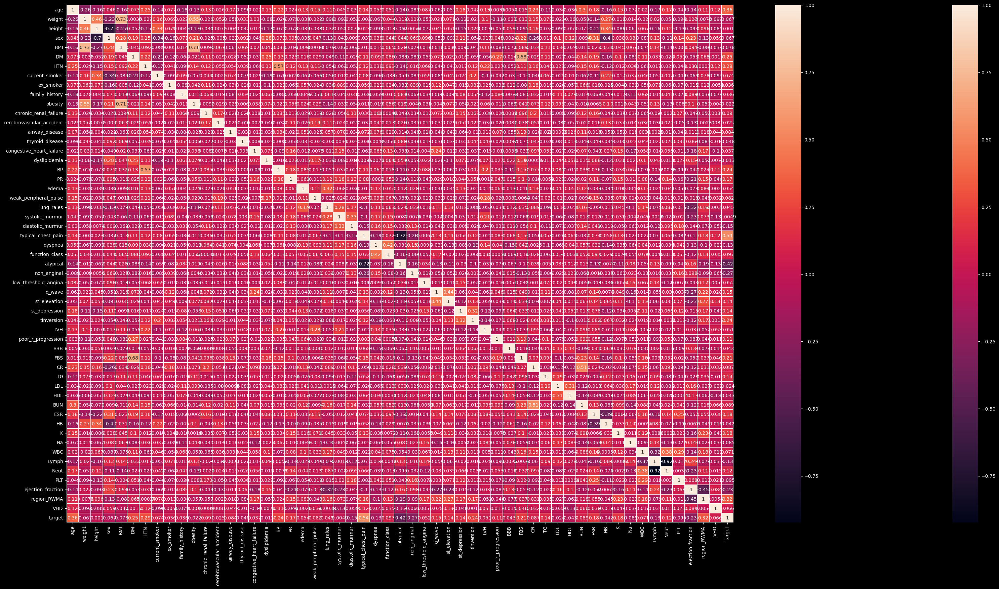

In [144]:
plt.figure(figsize=(40, 20))
sns.heatmap(dataset.corr())
top_corr_features = dataset.corr().index
g=sns.heatmap(dataset[top_corr_features].corr(),annot=True,linewidth=.10,cmap="rocket")

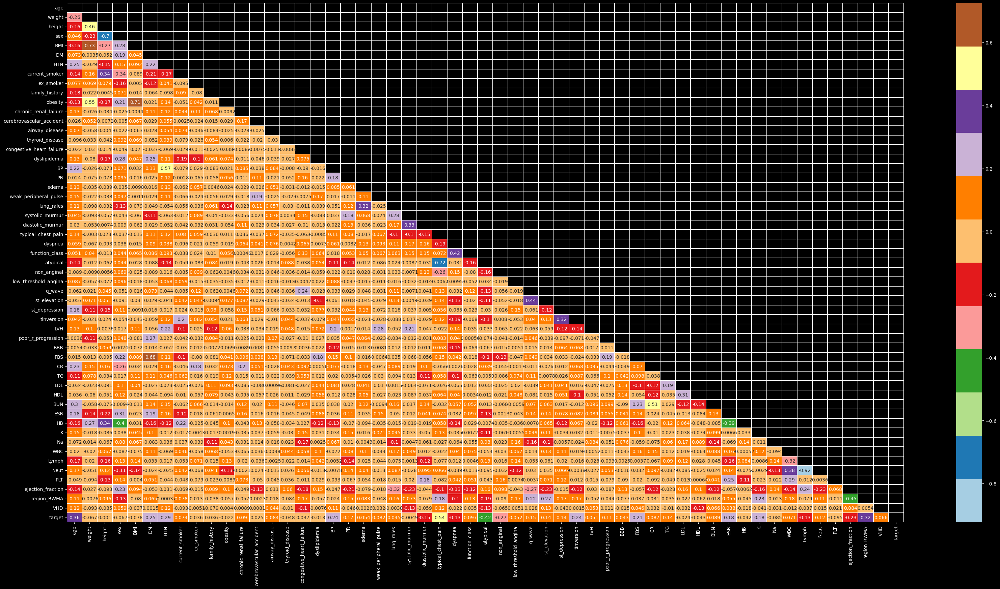

In [145]:
plt.figure(figsize=(40, 20))
matrix = np.triu(dataset.corr())
sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");

<Axes: ylabel='Count'>

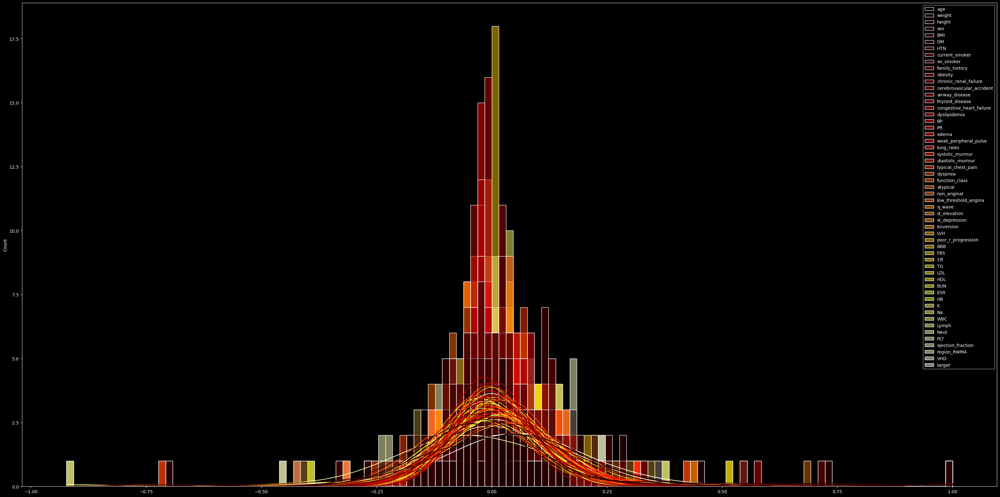

In [146]:
plt.figure(figsize=(40, 20))
sns.histplot(data=dataset.corr(),kde=True,palette='hot')

C:\Users\mahmo\AppData\Local\Temp\ipykernel_10204\527207683.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=dataset['age'],kde=True,palette='hot')


<Axes: xlabel='age', ylabel='Count'>

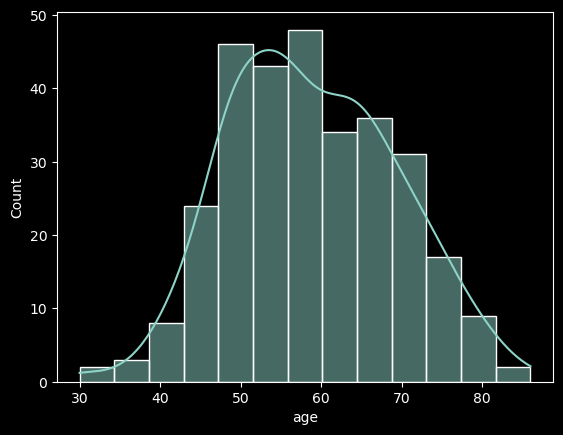

In [147]:
sns.histplot(data=dataset['age'],kde=True,palette='hot')

In [148]:
dataset

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53,90,175,0,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,1,1
1,67,70,157,1,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,1,1
2,54,54,164,0,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,3,1
3,66,67,158,1,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,2,0
4,50,87,153,1,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,0,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,1,1
299,55,64,152,1,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,3,0
300,48,77,160,1,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,1,0
301,57,90,159,1,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,1,0


# to show num of normal persons and CAD

In [149]:
df = dataset['target'].values.sum()
print(" Num of CAD  =",df ,"\n","but num of Normal =",303-df)

 Num of CAD  = 216 
 but num of Normal = 87


# Data Scaling

In [150]:
dataset

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53,90,175,0,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,1,1
1,67,70,157,1,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,1,1
2,54,54,164,0,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,3,1
3,66,67,158,1,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,2,0
4,50,87,153,1,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,0,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,1,1
299,55,64,152,1,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,3,0
300,48,77,160,1,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,1,0
301,57,90,159,1,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,1,0


In [151]:
dataset.columns

Index(['age', 'weight', 'height', 'sex', 'BMI', 'DM', 'HTN', 'current_smoker',
       'ex_smoker', 'family_history', 'obesity', 'chronic_renal_failure',
       'cerebrovascular_accident', 'airway_disease', 'thyroid_disease',
       'congestive_heart_failure', 'dyslipidemia', 'BP', 'PR', 'edema',
       'weak_peripheral_pulse', 'lung_rales', 'systolic_murmur',
       'diastolic_murmur', 'typical_chest_pain', 'dyspnea', 'function_class',
       'atypical', 'non_anginal', 'low_threshold_angina', 'q_wave',
       'st_elevation', 'st_depression', 'tinversion', 'LVH',
       'poor_r_progression', 'BBB', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN',
       'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT',
       'ejection_fraction', 'region_RWMA', 'VHD', 'target'],
      dtype='object')

In [152]:
dataset = np.array(dataset)
dataset

array([[ 53.,  90., 175., ...,   0.,   1.,   1.],
       [ 67.,  70., 157., ...,   4.,   1.,   1.],
       [ 54.,  54., 164., ...,   2.,   3.,   1.],
       ...,
       [ 48.,  77., 160., ...,   0.,   1.,   0.],
       [ 57.,  90., 159., ...,   0.,   1.,   0.],
       [ 56.,  85., 170., ...,   0.,   1.,   1.]])

In [153]:
SC = StandardScaler()
dataset[:,47:48] = SC.fit_transform(dataset[:,47:48])
dataset

array([[ 53.,  90., 175., ...,   0.,   1.,   1.],
       [ 67.,  70., 157., ...,   4.,   1.,   1.],
       [ 54.,  54., 164., ...,   2.,   3.,   1.],
       ...,
       [ 48.,  77., 160., ...,   0.,   1.,   0.],
       [ 57.,  90., 159., ...,   0.,   1.,   0.],
       [ 56.,  85., 170., ...,   0.,   1.,   1.]])

In [154]:
dataset = pd.DataFrame(dataset,columns =['age', 'weight', 'height', 'sex', 'BMI', 'DM', 'HTN', 'current_smoker',
       'ex_smoker', 'family_history', 'obesity', 'chronic_renal_failure',
       'cerebrovascular_accident', 'airway_disease', 'thyroid_disease',
       'congestive_heart_failure', 'dyslipidemia', 'BP', 'PR', 'edema',
       'weak_peripheral_pulse', 'lung_rales', 'systolic_murmur',
       'diastolic_murmur', 'typical_chest_pain', 'dyspnea', 'function_class',
       'atypical', 'non_anginal', 'low_threshold_angina', 'q_wave', 'st_elevation', 'st_depression',
       'tinversion', 'LVH', 'poor_r_progression', 'BBB', 'FBS', 'CR', 'TG',
       'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut',
       'PLT', 'ejection_fraction', 'region_RWMA', 'VHD', 'target'])
dataset

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
0,53.0,90.0,175.0,0.0,29.387755,0.0,1.0,1.0,0.0,0.0,...,4.7,141.0,-0.772712,39.0,52.0,261.0,50.0,0.0,1.0,1.0
1,67.0,70.0,157.0,1.0,28.398718,0.0,1.0,0.0,0.0,0.0,...,4.7,156.0,0.057248,38.0,55.0,165.0,40.0,4.0,1.0,1.0
2,54.0,54.0,164.0,0.0,20.077335,0.0,0.0,1.0,0.0,0.0,...,4.7,139.0,-0.067246,38.0,60.0,230.0,40.0,2.0,3.0,1.0
3,66.0,67.0,158.0,1.0,26.838648,0.0,1.0,0.0,0.0,0.0,...,4.4,142.0,2.256644,18.0,72.0,742.0,55.0,0.0,2.0,0.0
4,50.0,87.0,153.0,1.0,37.165193,0.0,1.0,0.0,0.0,0.0,...,4.0,140.0,0.679719,55.0,39.0,274.0,50.0,0.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58.0,84.0,168.0,0.0,29.761905,0.0,0.0,0.0,0.0,0.0,...,4.8,146.0,0.389232,34.0,58.0,251.0,45.0,0.0,1.0,1.0
299,55.0,64.0,152.0,1.0,27.700831,0.0,0.0,0.0,0.0,0.0,...,4.0,139.0,1.592675,16.0,80.0,377.0,40.0,0.0,3.0,0.0
300,48.0,77.0,160.0,1.0,30.078125,0.0,1.0,0.0,0.0,1.0,...,4.0,140.0,0.596722,35.0,55.0,279.0,55.0,0.0,1.0,0.0
301,57.0,90.0,159.0,1.0,35.599858,1.0,0.0,0.0,0.0,0.0,...,3.8,141.0,-1.561175,48.0,40.0,208.0,55.0,0.0,1.0,0.0


In [155]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       303 non-null    float64
 1   weight                    303 non-null    float64
 2   height                    303 non-null    float64
 3   sex                       303 non-null    float64
 4   BMI                       303 non-null    float64
 5   DM                        303 non-null    float64
 6   HTN                       303 non-null    float64
 7   current_smoker            303 non-null    float64
 8   ex_smoker                 303 non-null    float64
 9   family_history            303 non-null    float64
 10  obesity                   303 non-null    float64
 11  chronic_renal_failure     303 non-null    float64
 12  cerebrovascular_accident  303 non-null    float64
 13  airway_disease            303 non-null    float64
 14  thyroid_di

In [156]:
dataset.describe()

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,...,303.000000,303.000000,3.030000e+02,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,58.897690,73.831683,164.716172,0.419142,27.248339,0.297030,0.590759,0.207921,0.033003,0.158416,...,4.230693,140.996700,-5.862564e-18,32.399340,60.148515,221.488449,47.231023,0.620462,1.930693,0.712871
std,10.392278,11.987358,9.327661,0.494235,4.098865,0.457706,0.492507,0.406491,0.178941,0.365734,...,0.458202,3.807885,1.001654e+00,9.972592,10.182493,60.796199,8.927194,1.132531,1.109180,0.453171
min,30.000000,48.000000,140.000000,0.000000,18.115413,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,128.000000,-1.602673e+00,7.000000,32.000000,25.000000,15.000000,0.000000,0.000000,0.000000
25%,51.000000,65.000000,158.000000,0.000000,24.514380,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.900000,139.000000,-7.312145e-01,26.000000,52.500000,183.500000,45.000000,0.000000,1.000000,0.000000
50%,58.000000,74.000000,165.000000,0.000000,26.775510,0.000000,1.000000,0.000000,0.000000,0.000000,...,4.200000,141.000000,-1.917401e-01,32.000000,60.000000,210.000000,50.000000,0.000000,2.000000,1.000000
75%,66.000000,81.000000,171.000000,1.000000,29.411765,1.000000,1.000000,0.000000,0.000000,0.000000,...,4.500000,143.000000,5.137264e-01,39.000000,67.000000,250.000000,55.000000,1.000000,3.000000,1.000000
max,86.000000,120.000000,188.000000,1.000000,40.900658,1.000000,1.000000,1.000000,1.000000,1.000000,...,6.600000,156.000000,4.331545e+00,60.000000,89.000000,742.000000,60.000000,4.000000,3.000000,1.000000


In [157]:
dataset.corr()

,age,weight,height,sex,BMI,DM,HTN,current_smoker,ex_smoker,family_history,...,K,Na,WBC,Lymph,Neut,PLT,ejection_fraction,region_RWMA,VHD,target
age,1.000000,-0.264585,-0.163753,0.045769,-0.161414,0.072543,0.246690,-0.143879,0.076608,-0.183900,...,0.154203,-0.071886,0.020398,-0.171529,0.173030,-0.049500,-0.140512,0.108663,0.117735,0.357247
weight,-0.264585,1.000000,0.460631,-0.234529,0.725005,-0.003531,-0.028532,0.157385,0.068977,0.021963,...,-0.018287,0.013916,-0.020214,0.020120,-0.051093,-0.094192,0.026789,-0.007648,-0.092527,-0.066833
height,-0.163753,0.460631,1.000000,-0.700279,-0.269356,-0.052318,-0.153668,0.335248,0.079034,0.004488,...,-0.086277,-0.066590,0.066658,-0.156436,0.115075,-0.133446,-0.093295,0.095715,-0.085441,0.001024
sex,0.045769,-0.234529,-0.700279,1.000000,0.284088,0.194348,0.149278,-0.336330,-0.156932,0.071098,...,0.038046,0.079913,-0.086823,0.132539,-0.112422,0.143698,0.230896,-0.128955,0.059207,-0.067041
BMI,-0.161414,0.725005,-0.269356,0.284088,1.000000,0.045360,0.091652,-0.089398,0.005016,0.014045,...,0.044587,0.067402,-0.074928,0.139583,-0.140037,-0.003964,0.093903,-0.079739,-0.037365,-0.078189
DM,0.072543,-0.003531,-0.052318,0.194348,0.045360,1.000000,0.217864,-0.208458,-0.120087,-0.064434,...,0.100064,-0.083030,0.110345,0.033413,-0.024417,0.051054,-0.052507,0.064891,0.001550,0.252897
HTN,0.246690,-0.028532,-0.153668,0.149278,0.091652,0.217864,1.000000,-0.169000,0.041045,-0.098467,...,0.011826,0.036355,-0.069374,0.017204,-0.025476,-0.043840,0.031365,-0.000372,0.117629,0.287761
current_smoker,-0.143879,0.157385,0.335248,-0.336330,-0.089398,-0.208458,-0.169000,1.000000,-0.094652,0.089532,...,-0.016599,0.036812,0.046205,-0.053224,0.042115,-0.048473,-0.068943,0.078479,-0.092783,0.073504
ex_smoker,0.076608,0.068977,0.079034,-0.156932,0.005016,-0.120087,0.041045,-0.094652,1.000000,-0.080152,...,-0.004318,-0.038716,-0.057655,0.070524,-0.068122,-0.079102,-0.015153,0.012996,-0.005121,0.035578
family_history,-0.183900,0.021963,0.004488,0.071098,0.014045,-0.064434,-0.098467,0.089532,-0.080152,1.000000,...,-0.017255,-0.113749,0.067973,-0.014679,0.040786,-0.023000,0.089157,-0.038230,-0.078958,0.035605


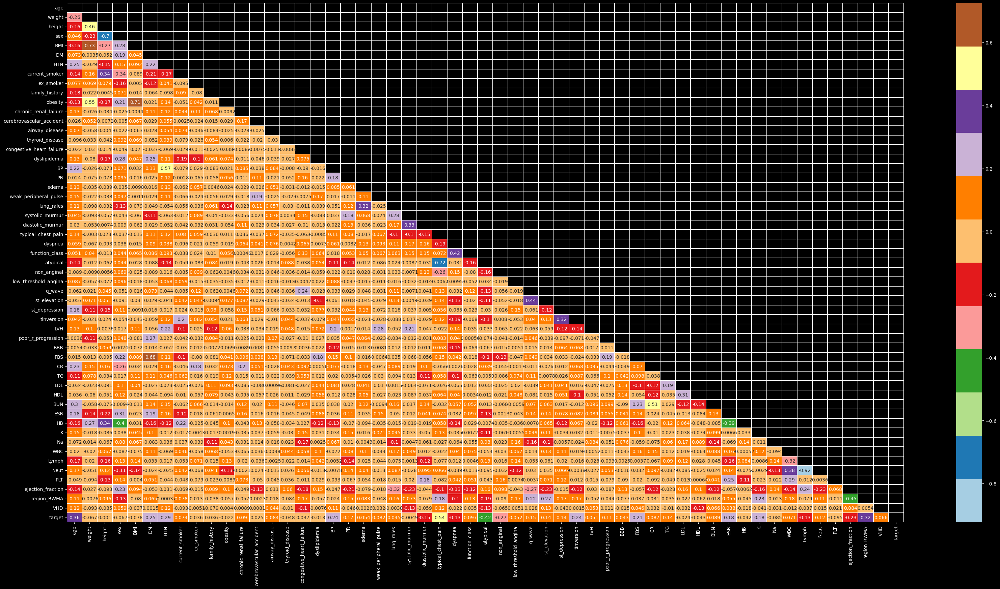

In [158]:
plt.figure(figsize=(40, 20))
matrix = np.triu(dataset.corr())
sns.heatmap(dataset.corr(), annot=True, linewidth=.10, mask=matrix, cmap="Paired");

# Splitting Data to input(X) & output(Y)

In [159]:
x = dataset.iloc[:,:-1].values
x

array([[ 53.,  90., 175., ...,  50.,   0.,   1.],
       [ 67.,  70., 157., ...,  40.,   4.,   1.],
       [ 54.,  54., 164., ...,  40.,   2.,   3.],
       ...,
       [ 48.,  77., 160., ...,  55.,   0.,   1.],
       [ 57.,  90., 159., ...,  55.,   0.,   1.],
       [ 56.,  85., 170., ...,  55.,   0.,   1.]])

In [160]:
y = dataset.iloc[:,-1].values
y

array([1., 1., 1., 0., 0., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 0.,
       0., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 0., 1., 1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 1., 0., 1., 1.,
       1., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0.,
       0., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
       0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 1., 0., 1., 1.,
       0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 0., 1.,
       0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0.,
       0., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 0.,
       1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 1., 0.,
       0., 1., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1.,
       1., 1., 1., 1., 1.

# train test split (90%:10%)

In [161]:
x_train , x_test , y_train , y_test = train_test_split(x,y,test_size=0.1,random_state = 0)

# Normalization

In [162]:
# Scaling data using normalization (MinMaxScaler) to have their values between 0-1
# This is usually suitable for algorithms that rely on the magnitude of the values, such as neural networks and algorithms that use distance-based metrics, 
# like K-means clustering, KNN or support vector machines.
# It is particularly useful when the features have different ranges, and you want to ensure that they are all on a similar scale.

from sklearn.preprocessing import MinMaxScaler

scaler_mm = MinMaxScaler()
X_train_mm = scaler_mm.fit_transform(x_train)
X_test_mm = scaler_mm.transform(x_test)

In [172]:
import time
def get_metrics_results(y_true, y_pred, verbose = False):
    results = []
    start = time.time()
    for metric_func in [accuracy_score, roc_auc_score, precision_score, recall_score, f1_score]:
        current_res = metric_func(y_true, y_pred)
        results.append(current_res)
        if verbose: print(f"{metric_func.__name__}: {current_res}")
        start = time.time()
        
    return results
    end = time.time()
    print('Execution time is:')
    print(end - start)
    
def plot_confusion_matrix (Model_Prediction,title):
    cm = confusion_matrix(y_test, Model_Prediction)
    class_names = ['CAD','Normal']
    plt.title(title)
    df_cm = pd.DataFrame(cm, index = [i for i in class_names], columns = [i for i in class_names])
    sns.heatmap(df_cm, annot = True)
    cmap = plt.cm.Blues
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)

# Applying Algo in data

# Logistic Regression (87%)

In [189]:
LR = LogisticRegression(random_state=42)
parameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500]
}
lr_clf = RandomizedSearchCV(LR, parameters, scoring='f1', n_iter=250)
lr_clf.fit(X=X_train_mm, y=y_train)
lr_best = lr_clf.best_params_
print(lr_clf.best_params_)
y_pred1 = lr_clf.predict(X_test_mm)
y_pred1

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep t

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linea

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


{'solver': 'saga', 'penalty': 'l1', 'max_iter': 400, 'C': 1}


array([1., 1., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0.])

In [190]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [192]:
get_metrics_results(y_test, y_pred1, verbose = True)

accuracy_score: 0.8709677419354839
roc_auc_score: 0.8181818181818181
precision_score: 0.8333333333333334
recall_score: 1.0
f1_score: 0.9090909090909091


[0.8709677419354839,
 0.8181818181818181,
 0.8333333333333334,
 1.0,
 0.9090909090909091]

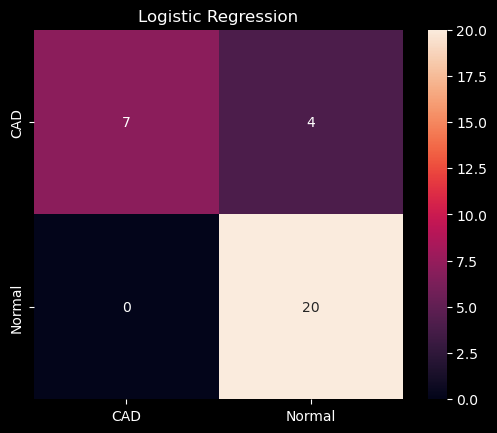

In [193]:
plot_confusion_matrix(y_pred1 , "Logistic Regression")

([<matplotlib.patches.Wedge at 0x2458e818310>,
 [Text(-0.4368626645752139, -1.0095300947967052, 'Correct Result'),
  Text(0.436862664575214, 1.009530094796705, 'Wrong Result')],
 [Text(-0.23828872613193483, -0.550652778980021, '87%'),
  Text(0.23828872613193489, 0.5506527789800209, '13%')])

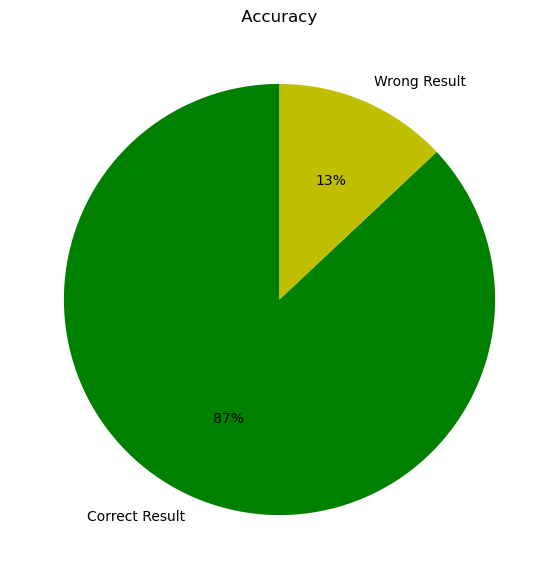

In [195]:
acc1 = np.round(accuracy_score(y_test, y_pred)*100)
plt.style.use('default')
plt.figure(figsize=(12,7))
data = [acc1,100-acc1]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# SVC(87%)

In [196]:
svc = SVC(kernel='linear', max_iter=500)
svc.fit(X_train_mm,y_train)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVC(kernel='linear', max_iter=500)

In [205]:
y_pred2 = svc.predict(X_test_mm)
y_pred2

array([1., 1., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0.])

In [206]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [207]:
get_metrics_results(y_test, y_pred2, verbose = True)

accuracy_score: 0.8709677419354839
roc_auc_score: 0.8181818181818181
precision_score: 0.8333333333333334
recall_score: 1.0
f1_score: 0.9090909090909091


[0.8709677419354839,
 0.8181818181818181,
 0.8333333333333334,
 1.0,
 0.9090909090909091]

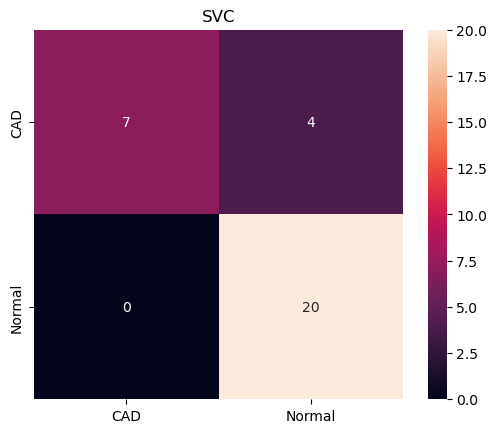

In [208]:
plot_confusion_matrix(y_pred2 , "SVC")

In [209]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred2})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,1.0
6,0.0,1.0
7,0.0,0.0
8,1.0,1.0
9,0.0,0.0


In [210]:
print ('y_test = ',y_test.sum())
print ('y_pred = ',y_pred2.sum())

y_test =  20.0
y_pred =  24.0


<Axes: title={'center': ' Actual & Predict '}>

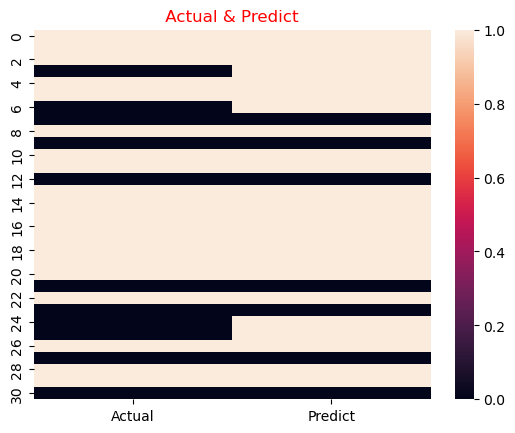

In [211]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x2458ead39d0>,
 [Text(-0.4368626645752139, -1.0095300947967052, 'Correct Result'),
  Text(0.436862664575214, 1.009530094796705, 'Wrong Result')],
 [Text(-0.23828872613193483, -0.550652778980021, '87%'),
  Text(0.23828872613193489, 0.5506527789800209, '13%')])

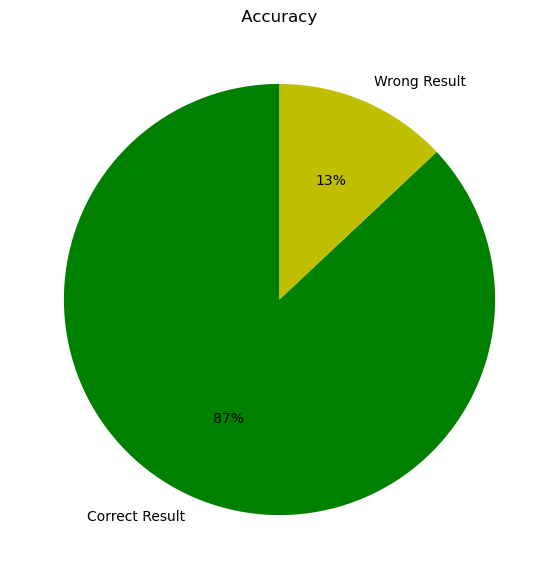

In [212]:
acc = np.round(accuracy_score(y_test, y_pred2)*100)
plt.style.use('default')
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# RandomForestClassifier(90%)

In [213]:
RFC = RandomForestClassifier(n_estimators = 250,max_features = 50)
parameters = {'n_estimators': [30, 35, 40, 45], 'max_depth': [4, 5, 6, 7, 8], 'min_impurity_decrease': [0, 0.001, 0.01],
             'criterion': ["gini", "entropy", "log_loss"], 'min_samples_split': [4, 5, 6, 7], 
            'max_features': ["sqrt", "log2", None]
             }
rf_clf=RandomizedSearchCV(RFC, parameters, scoring='accuracy', n_iter=1000)
rf_clf.fit(X=X_train_mm, y=y_train)
rf_best = rf_clf.best_params_
print(rf_clf.best_params_)
y_pred3=rf_clf.predict(X_test_mm)
y_pred3

{'n_estimators': 40, 'min_samples_split': 6, 'min_impurity_decrease': 0.001, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'gini'}


array([1., 1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0.])

In [214]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [217]:
get_metrics_results(y_test, y_pred3, verbose = True)

accuracy_score: 0.8064516129032258
roc_auc_score: 0.7477272727272726
precision_score: 0.7916666666666666
recall_score: 0.95
f1_score: 0.8636363636363635


[0.8064516129032258,
 0.7477272727272726,
 0.7916666666666666,
 0.95,
 0.8636363636363635]

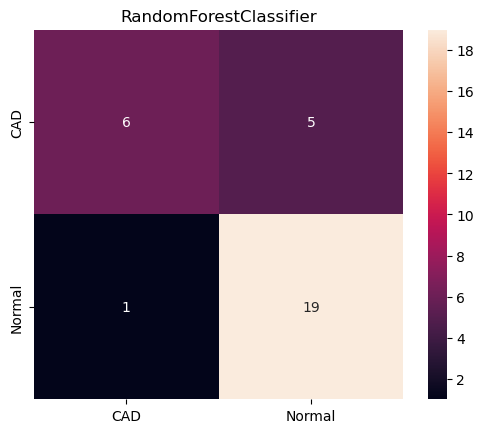

In [219]:
plot_confusion_matrix(y_pred3 , "RandomForestClassifier")

In [220]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred3})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,0.0
6,0.0,1.0
7,0.0,0.0
8,1.0,1.0
9,0.0,1.0


<Axes: title={'center': ' Actual & Predict '}>

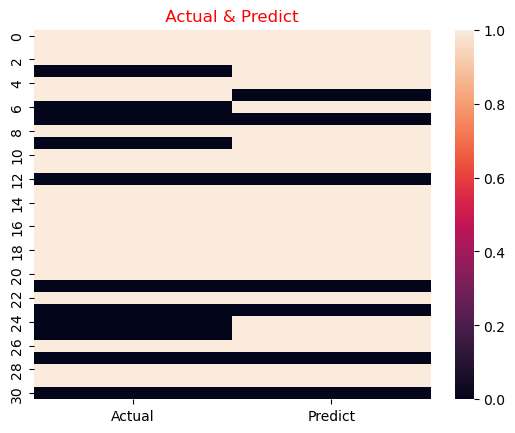

In [221]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x2458ee8b040>,
 [Text(-0.618291708822899, -0.9097886363331099, 'Correct Result'),
  Text(0.6182917088228991, 0.9097886363331099, 'Wrong Result')],
 [Text(-0.33725002299430845, -0.4962483470907872, '81%'),
  Text(0.33725002299430856, 0.4962483470907872, '19%')])

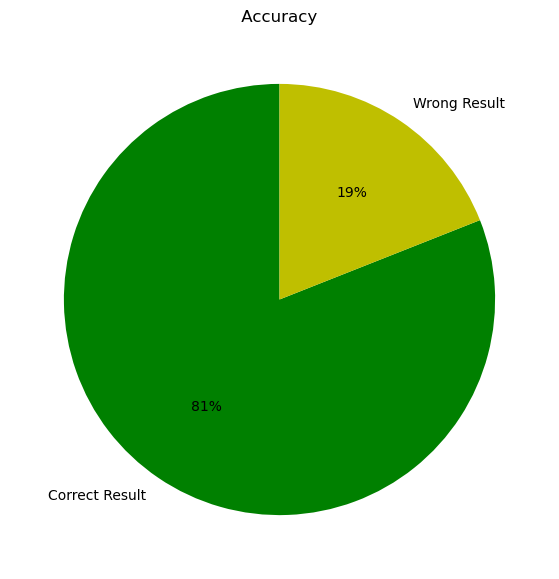

In [222]:
acc = np.round(accuracy_score(y_test, y_pred3)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# KNeighborsClassifier

In [223]:
knn=KNeighborsClassifier()
parameters = {'n_neighbors':[40, 45, 50], 'weights':['uniform', 'distance'], 'metric' : ['minkowski','euclidean','manhattan']}
knn_clf=RandomizedSearchCV(knn, parameters, scoring='f1', n_iter=100)
knn_clf.fit(X=X_train_mm, y=y_train)
knn_best = knn_clf.best_params_
print(knn_clf.best_params_)
y_pred4=knn_clf.predict(X_test_mm)
y_pred4

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 18 is smaller than n_iter=100. Running 18 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


{'weights': 'distance', 'n_neighbors': 50, 'metric': 'minkowski'}


array([1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1., 1., 0.])

In [224]:
get_metrics_results(y_test, y_pred4, verbose = True)

accuracy_score: 0.8387096774193549
roc_auc_score: 0.7727272727272727
precision_score: 0.8
recall_score: 1.0
f1_score: 0.888888888888889


[0.8387096774193549, 0.7727272727272727, 0.8, 1.0, 0.888888888888889]

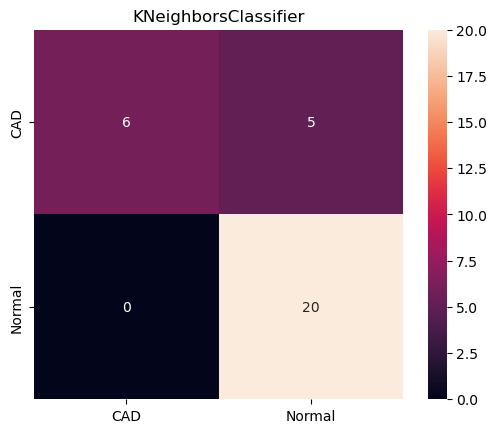

In [231]:
plot_confusion_matrix(y_pred4 , "KNeighborsClassifier")

In [226]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred4})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,1.0
6,0.0,1.0
7,0.0,0.0
8,1.0,1.0
9,0.0,1.0


<Axes: title={'center': ' Actual & Predict '}>

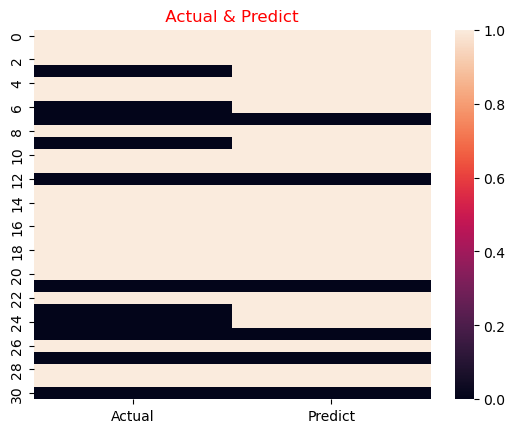

In [227]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x2458e9818a0>,
 [Text(-0.5299291209321735, -0.9639373043865738, 'Correct Result'),
  Text(0.529929211182495, 0.9639372547710244, 'Wrong Result')],
 [Text(-0.2890522477811855, -0.5257839842108584, '84%'),
  Text(0.2890522970086336, 0.5257839571478314, '16%')])

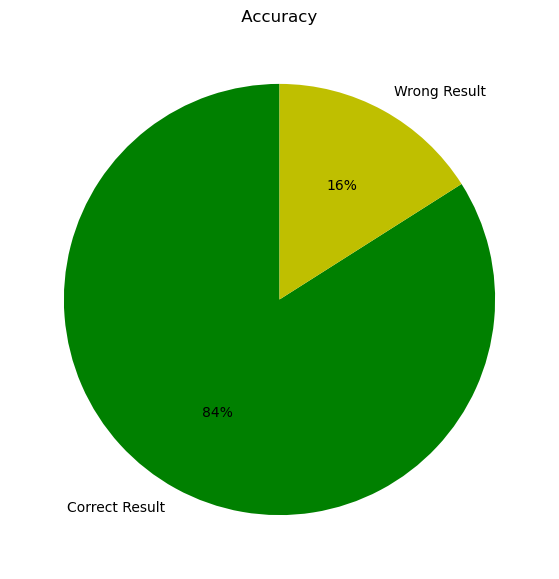

In [228]:
acc = np.round(accuracy_score(y_test, y_pred4)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# XGBoost (90%)

In [229]:
xgb_classifier = xgb.XGBClassifier(random_state=42)
parameters = {
    'learning_rate': [0.01, 0.02, 0.03, 0.1],
    'n_estimators': [300, 400, 500],
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [0.2, 0.5, 1, 2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [0, 0.1, 0.2, 0.3],
    'alpha': [0, 0.1, 0.2, 0.3]
}
xgb_clf = RandomizedSearchCV(xgb_classifier, parameters, scoring='accuracy', n_iter=250)
xgb_clf.fit(X=X_train_mm, y=y_train)
xgb_best = xgb_clf.best_params_
print(xgb_clf.best_params_)
y_pred5 = xgb_clf.predict(X_test_mm)
y_pred5

{'subsample': 0.9, 'n_estimators': 500, 'min_child_weight': 0.5, 'max_depth': 3, 'learning_rate': 0.1, 'lambda': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.9, 'alpha': 0}


array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0])

In [77]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [230]:
get_metrics_results(y_test, y_pred5, verbose = True)

accuracy_score: 0.8387096774193549
roc_auc_score: 0.7727272727272727
precision_score: 0.8
recall_score: 1.0
f1_score: 0.888888888888889


[0.8387096774193549, 0.7727272727272727, 0.8, 1.0, 0.888888888888889]

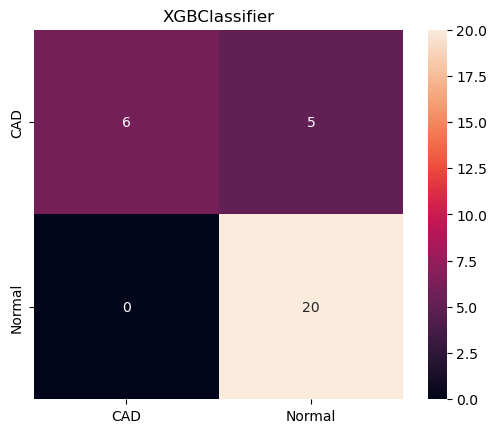

In [232]:
plot_confusion_matrix(y_pred5 , "XGBClassifier")

In [233]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred5})
df_comp

,Actual,Predict
0,1.0,1
1,1.0,1
2,1.0,1
3,0.0,1
4,1.0,1
5,1.0,1
6,0.0,1
7,0.0,0
8,1.0,1
9,0.0,1


<Axes: title={'center': ' Actual & Predict '}>

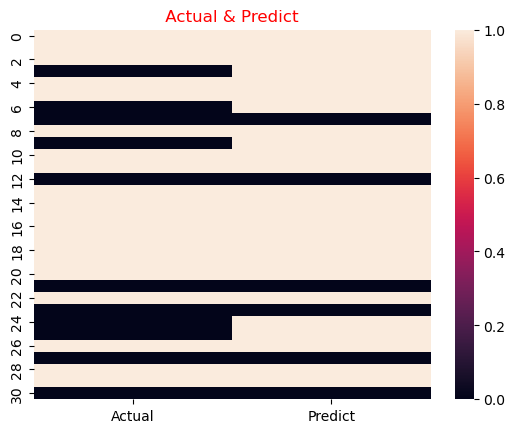

In [234]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x2458f046d10>,
 [Text(-0.5299291209321735, -0.9639373043865738, 'Correct Result'),
  Text(0.529929211182495, 0.9639372547710244, 'Wrong Result')],
 [Text(-0.2890522477811855, -0.5257839842108584, '84%'),
  Text(0.2890522970086336, 0.5257839571478314, '16%')])

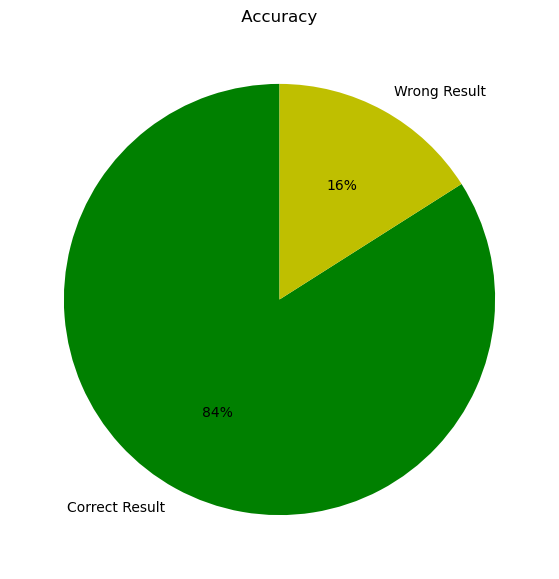

In [235]:
acc = np.round(accuracy_score(y_test, y_pred5)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# Cat Boost Classifier(90%)

In [236]:
catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)
parameters = {
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'iterations': [50, 100, 200],
    'depth': [3, 4, 5, 6],
    'l2_leaf_reg': [7, 9, 10, 11, 12],
    'border_count': [64, 128, 255],
    'subsample': [0.5, 0.6, 0.7, 1.0],
    'colsample_bylevel': [0.8, 0.9, 1.0],
    'min_data_in_leaf': [2, 4, 6, 10],
    'max_leaves': [15, 31, 63],
    'auto_class_weights': ['None', 'Balanced'],
}
catboost_clf = RandomizedSearchCV(catboost_classifier, parameters, scoring='f1', n_iter=250)
catboost_clf.fit(X=X_train_mm, y=y_train)
catboost_best = catboost_clf.best_params_
print(catboost_clf.best_params_)
y_pred6 = catboost_clf.predict(X_test_mm)
y_pred6

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
800 fits failed out of a total of 1250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
800 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mahmo\anaconda3\lib\site-packages\catboost\core.py", line 5131, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "C:\Users\mahmo\anaconda3\lib\site-packages\catboost\core.py", line 234

{'subsample': 0.5, 'min_data_in_leaf': 2, 'max_leaves': 31, 'learning_rate': 0.2, 'l2_leaf_reg': 10, 'iterations': 200, 'depth': 3, 'colsample_bylevel': 1.0, 'border_count': 64, 'auto_class_weights': 'Balanced'}


array([1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 0., 1., 0., 1., 1., 0.])

In [237]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [238]:
get_metrics_results(y_test, y_pred6, verbose = True)

accuracy_score: 0.8709677419354839
roc_auc_score: 0.8181818181818181
precision_score: 0.8333333333333334
recall_score: 1.0
f1_score: 0.9090909090909091


[0.8709677419354839,
 0.8181818181818181,
 0.8333333333333334,
 1.0,
 0.9090909090909091]

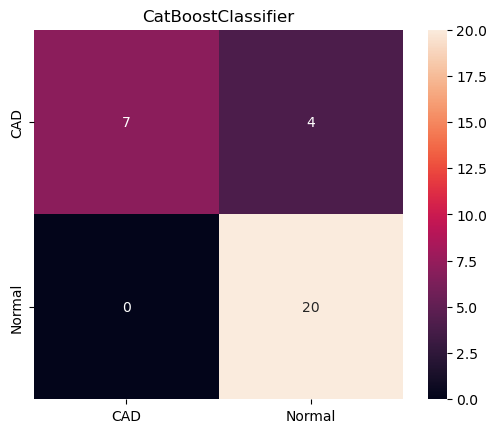

In [239]:
plot_confusion_matrix(y_pred6 , "CatBoostClassifier")

In [240]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred6})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,1.0
6,0.0,1.0
7,0.0,0.0
8,1.0,1.0
9,0.0,1.0


<Axes: title={'center': ' Actual & Predict '}>

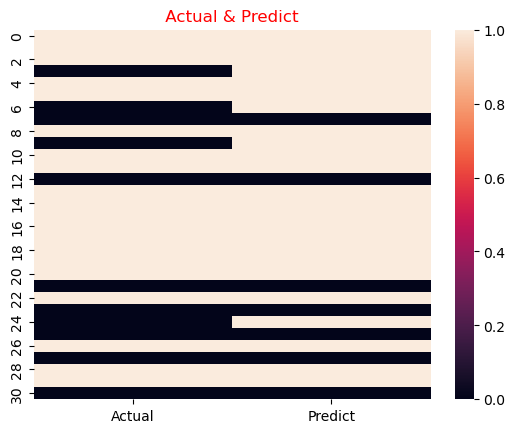

In [241]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x2459f361a20>,
 [Text(-0.4368626645752139, -1.0095300947967052, 'Correct Result'),
  Text(0.436862664575214, 1.009530094796705, 'Wrong Result')],
 [Text(-0.23828872613193483, -0.550652778980021, '87%'),
  Text(0.23828872613193489, 0.5506527789800209, '13%')])

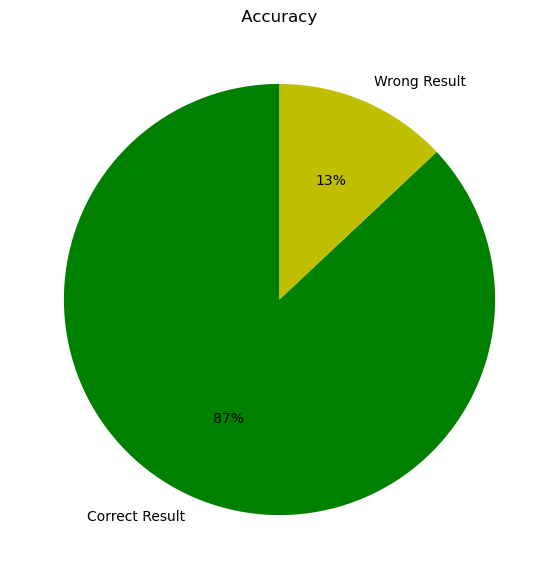

In [242]:
acc = np.round(accuracy_score(y_test, y_pred6)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# AdaBoostClassifier

In [252]:
'''adaboost_classifier = AdaBoostClassifier(random_state=42)
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'base_estimator__max_depth': [5, 8, 10],
    'base_estimator__min_samples_split': [2, 5, 10],
    'base_estimator__min_samples_leaf': [4, 5, 10],
}
adaboost_clf = RandomizedSearchCV(adaboost_classifier, parameters, scoring='f1', n_iter=250)
adaboost_clf.fit(X=X_train_mm, y=y_train)
adaboost_best = catboost_clf.best_params_
print(adaboost_clf.best_params_)
y_pred7 = adaboost_clf.predict(X_test_mm)
y_pred7'''

"adaboost_classifier = AdaBoostClassifier(random_state=42)\nparameters = {\n    'n_estimators': [50, 100, 200, 300],\n    'learning_rate': [0.01, 0.02, 0.05, 0.1],\n    'base_estimator__max_depth': [5, 8, 10],\n    'base_estimator__min_samples_split': [2, 5, 10],\n    'base_estimator__min_samples_leaf': [4, 5, 10],\n}\nadaboost_clf = RandomizedSearchCV(adaboost_classifier, parameters, scoring='f1', n_iter=250)\nadaboost_clf.fit(X=X_train_mm, y=y_train)\nadaboost_best = catboost_clf.best_params_\nprint(adaboost_clf.best_params_)\ny_pred7 = adaboost_clf.predict(X_test_mm)\ny_pred7"

In [250]:
# Define the base estimator (Decision Tree)
base_estimator = DecisionTreeClassifier(random_state=42)

# Create the AdaBoostClassifier with the base estimator
adaboost_classifier = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Define the parameter space
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'base_estimator__max_depth': [5, 8, 10],
    'base_estimator__min_samples_split': [2, 5, 10],
    'base_estimator__min_samples_leaf': [4, 5, 10],
}

# Create RandomizedSearchCV
adaboost_clf = RandomizedSearchCV(adaboost_classifier, parameters, scoring='f1', n_iter=250)
adaboost_clf.fit(X=X_train_mm, y=y_train)

# Access the best parameters
adaboost_best = adaboost_clf.best_params_
print(adaboost_best)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


{'n_estimators': 200, 'learning_rate': 0.1, 'base_estimator__min_samples_split': 5, 'base_estimator__min_samples_leaf': 10, 'base_estimator__max_depth': 10}


array([1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0.])

In [254]:
# Make predictions
y_pred7 = adaboost_clf.predict(X_test_mm)
y_pred7

array([1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0.])

In [255]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [256]:
get_metrics_results(y_test, y_pred7, verbose = True)

accuracy_score: 0.7419354838709677
roc_auc_score: 0.6568181818181817
precision_score: 0.7307692307692307
recall_score: 0.95
f1_score: 0.8260869565217392


[0.7419354838709677,
 0.6568181818181817,
 0.7307692307692307,
 0.95,
 0.8260869565217392]

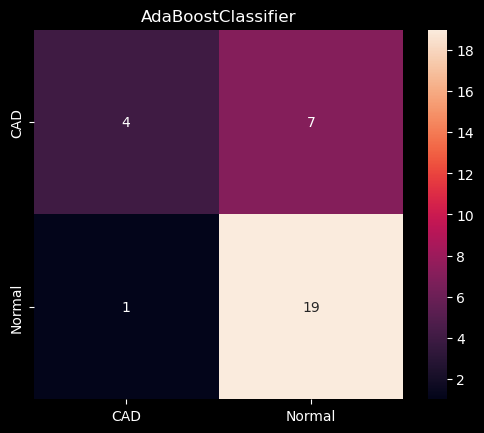

In [257]:
plot_confusion_matrix(y_pred7 , "AdaBoostClassifier")

In [258]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred7})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,0.0
6,0.0,1.0
7,0.0,1.0
8,1.0,1.0
9,0.0,1.0


<Axes: title={'center': ' Actual & Predict '}>

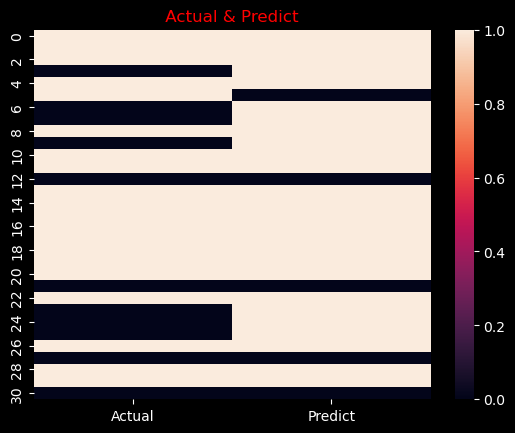

In [259]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a271e530>,
 [Text(-0.8018654676031948, -0.753001840545898, 'Correct Result'),
  Text(0.8018654676031949, 0.7530018405458979, 'Wrong Result')],
 [Text(-0.4373811641471971, -0.4107282766613989, '74%'),
  Text(0.43738116414719713, 0.41072827666139883, '26%')])

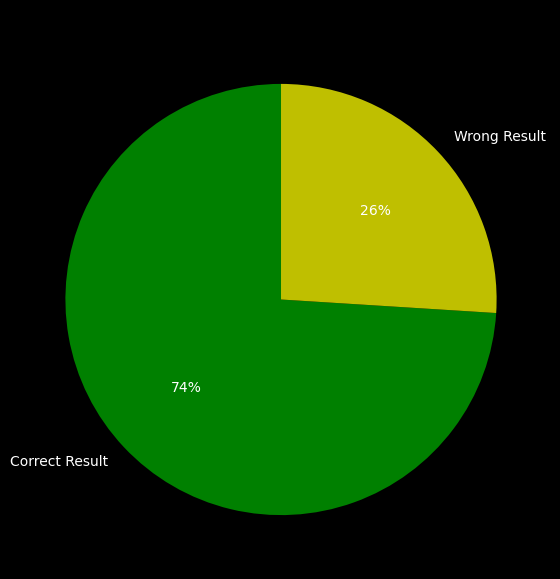

In [260]:
acc = np.round(accuracy_score(y_test, y_pred7)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# LGBMClassifier

In [262]:
LGB = LGBMClassifier(random_state=42)
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'base_estimator__max_depth': [5, 8, 10],
    'base_estimator__min_samples_split': [2, 5, 10],
    'base_estimator__min_samples_leaf': [4, 5, 10],
}
LGB_clf = RandomizedSearchCV(LGB, parameters, scoring='f1', n_iter=250)
LGB_clf.fit(X=X_train_mm, y=y_train)

# Access the best parameters
LGB_best = LGB_clf.best_params_
print(LGB_best)

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

In [263]:
# Make predictions
y_pred8 = LGB_clf.predict(X_test_mm)
y_pred8

array([1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0.])

In [264]:
y_test

array([1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0.])

In [265]:
get_metrics_results(y_test, y_pred8, verbose = True)

accuracy_score: 0.8387096774193549
roc_auc_score: 0.7727272727272727
precision_score: 0.8
recall_score: 1.0
f1_score: 0.888888888888889


[0.8387096774193549, 0.7727272727272727, 0.8, 1.0, 0.888888888888889]

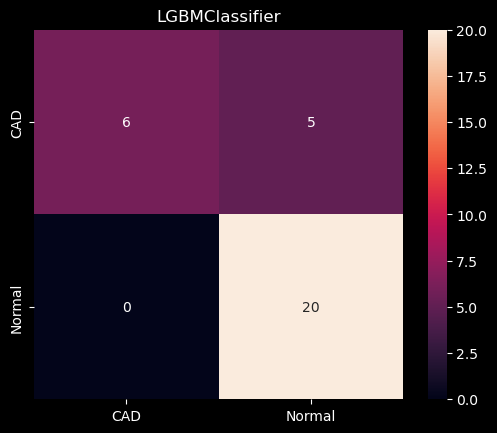

In [266]:
plot_confusion_matrix(y_pred8 , "LGBMClassifier")

In [267]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred8})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
5,1.0,1.0
6,0.0,1.0
7,0.0,0.0
8,1.0,1.0
9,0.0,1.0


<Axes: title={'center': ' Actual & Predict '}>

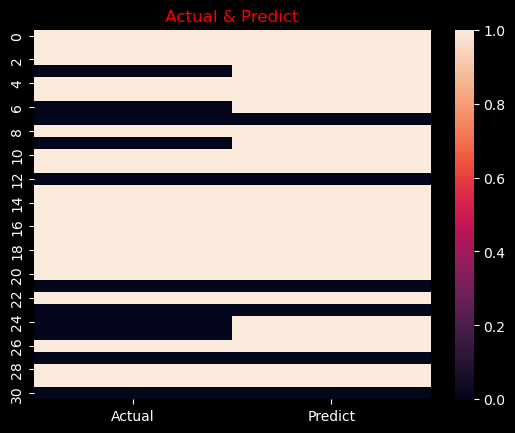

In [268]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a2a47d90>,
 [Text(-0.5299291209321735, -0.9639373043865738, 'Correct Result'),
  Text(0.529929211182495, 0.9639372547710244, 'Wrong Result')],
 [Text(-0.2890522477811855, -0.5257839842108584, '84%'),
  Text(0.2890522970086336, 0.5257839571478314, '16%')])

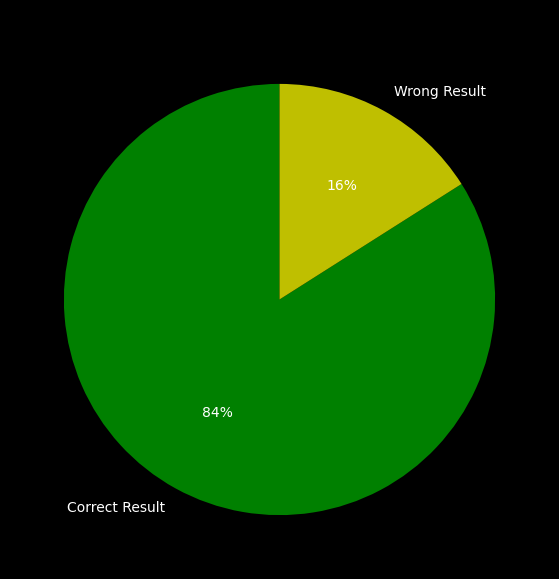

In [269]:
acc = np.round(accuracy_score(y_test, y_pred8)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# **************************************************************************************************************

# Imbalanced Data

In [270]:
'''# Generate a synthetic imbalanced dataset
x, y = make_classification(n_samples=1000, n_features=20, n_informative=2,
                           n_redundant=10, n_classes=2, weights=[0.99],
                           flip_y=0, random_state=1)
print("Before oversampling:", Counter(y))
'''

'# Generate a synthetic imbalanced dataset\nx, y = make_classification(n_samples=1000, n_features=20, n_informative=2,\n                           n_redundant=10, n_classes=2, weights=[0.99],\n                           flip_y=0, random_state=1)\nprint("Before oversampling:", Counter(y))\n'

In [271]:
# Apply SMOTE
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(x, y)
print("After oversampling:", Counter(y_resampled))

After oversampling: Counter({1.0: 216, 0.0: 216})


# SMOTEENN

In [272]:
# Trying out SMOTEENN
from imblearn.combine import SMOTEENN
print('Original dataset shape %s' % Counter(y_train))

smoteenn = SMOTEENN(random_state = 42)
X_smoteenn_mm, y_smoteenn_mm = smoteenn.fit_resample(X_train_mm, y_train)
print('Resampled dataset shape %s' % Counter(y_smoteenn_mm))

Original dataset shape Counter({1.0: 196, 0.0: 76})
Resampled dataset shape Counter({0.0: 178, 1.0: 114})


In [273]:
'''# Trying out SMOTEENN
from imblearn.combine import SMOTEENN
print('Original dataset shape %s' % Counter(y_train))

smoteenn = SMOTEENN(random_state = 42)
X_smoteenn_mm, y_smoteenn_mm = smoteenn.fit_resample(X_test_mm, y_test)
print('Resampled dataset shape %s' % Counter(y_smoteenn_mm))'''

"# Trying out SMOTEENN\nfrom imblearn.combine import SMOTEENN\nprint('Original dataset shape %s' % Counter(y_train))\n\nsmoteenn = SMOTEENN(random_state = 42)\nX_smoteenn_mm, y_smoteenn_mm = smoteenn.fit_resample(X_test_mm, y_test)\nprint('Resampled dataset shape %s' % Counter(y_smoteenn_mm))"

In [329]:
x_train , x_test , y_train , y_test = train_test_split(X_smoteenn_mm,y_smoteenn_mm,test_size=0.1,random_state = 0)

In [330]:
x_train

array([[0.42857143, 0.08333333, 0.5       , ..., 0.55555556, 0.5       ,
        1.        ],
       [0.35714286, 0.375     , 0.72916667, ..., 0.77777778, 0.        ,
        0.33333333],
       [0.66710658, 0.29545148, 0.34387038, ..., 0.92866315, 0.        ,
        0.33333333],
       ...,
       [0.20313441, 0.52464839, 0.30858826, ..., 0.7819503 , 0.        ,
        0.33333333],
       [0.44642857, 0.25      , 0.25      , ..., 0.88888889, 0.        ,
        0.33333333],
       [0.43959533, 0.25960182, 0.50857415, ..., 0.88888889, 0.        ,
        0.93140684]])

# Applying Algo in data After SMOTEENN

# Logistic Regression (97%)

In [331]:
LR = LogisticRegression(random_state=42)
parameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500]
}
lr_clf = RandomizedSearchCV(LR, parameters, scoring='f1', n_iter=250)
lr_clf.fit(x_train,y_train)
lr_best = lr_clf.best_params_
print(lr_clf.best_params_)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter 

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linea

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


{'solver': 'saga', 'penalty': 'l2', 'max_iter': 200, 'C': 1}


C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
630 fits failed out of a total of 1250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
65 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 54, in _check_solver
    raise ValueError(
Va

In [332]:
y_pred9 = lr_clf.predict(x_test)
y_pred9

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0.])

In [333]:
get_metrics_results(y_test, y_pred9, verbose = True)

accuracy_score: 0.9666666666666667
roc_auc_score: 0.9642857142857143
precision_score: 1.0
recall_score: 0.9285714285714286
f1_score: 0.962962962962963


[0.9666666666666667,
 0.9642857142857143,
 1.0,
 0.9285714285714286,
 0.962962962962963]

In [334]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred9})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

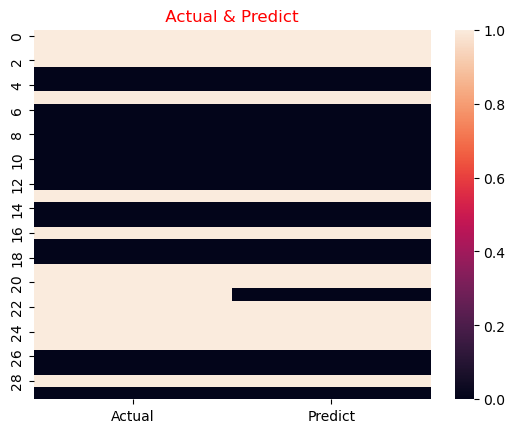

In [335]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

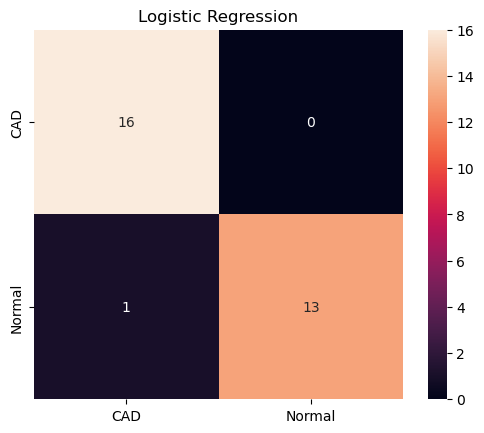

In [336]:
plot_confusion_matrix(y_pred9 , "Logistic Regression")

([<matplotlib.patches.Wedge at 0x245a443b160>,
 [Text(-0.10351904621929815, -1.095118170367859, 'Correct Result'),
  Text(0.10351895009520744, 1.095118179454248, 'Wrong Result')],
 [Text(-0.05646493430143535, -0.597337183837014, '97%'),
  Text(0.05646488187011314, 0.5973371887932261, '3%')])

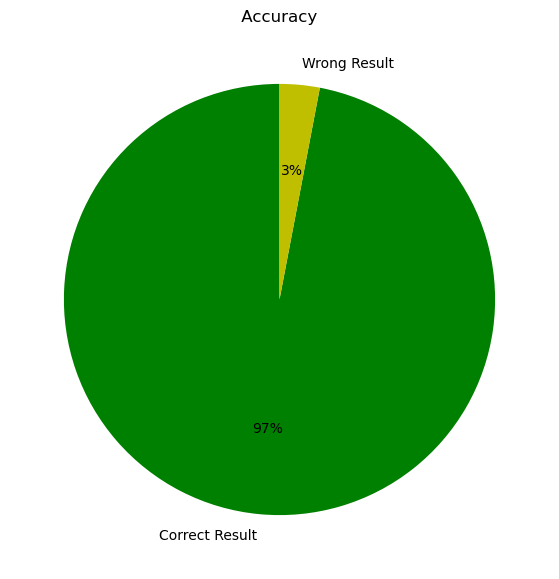

In [337]:
acc = np.round(accuracy_score(y_test, y_pred9)*100)
plt.style.use('default')
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# SVC (93.3%)

In [338]:
svc = SVC(kernel='linear', max_iter=500)
svc.fit(x_train,y_train)

SVC(kernel='linear', max_iter=500)

In [339]:
y_pred10 = svc.predict(x_test)
y_pred10

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0.])

In [340]:
y_test

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0.])

In [341]:
get_metrics_results(y_test, y_pred10, verbose = True)

accuracy_score: 0.9333333333333333
roc_auc_score: 0.9285714285714286
precision_score: 1.0
recall_score: 0.8571428571428571
f1_score: 0.923076923076923


[0.9333333333333333,
 0.9285714285714286,
 1.0,
 0.8571428571428571,
 0.923076923076923]

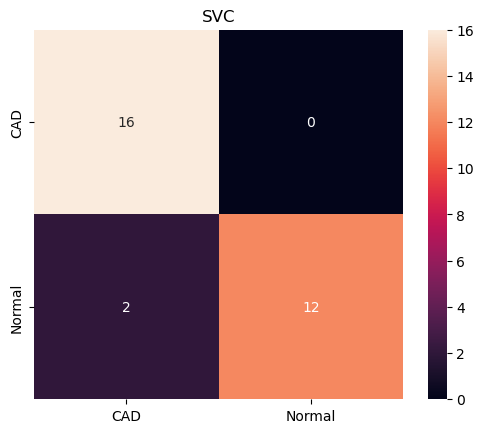

In [342]:
plot_confusion_matrix(y_pred10 , "SVC")

In [343]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred10})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


In [344]:
print ('y_test = ',y_test.sum())
print ('y_pred = ',y_pred10.sum())

y_test =  14.0
y_pred =  12.0


<Axes: title={'center': ' Actual & Predict '}>

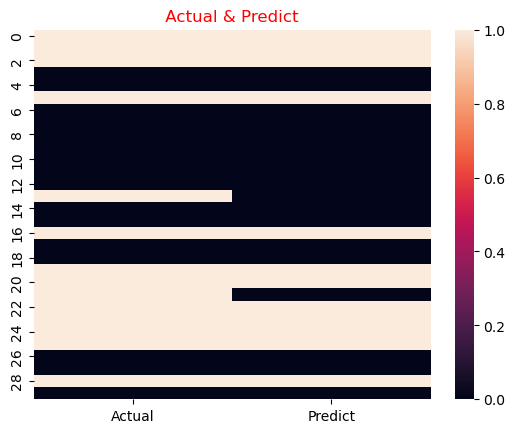

In [345]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a54d72b0>,
 [Text(-0.23995754141400993, -1.0735084435245694, 'Correct Result'),
  Text(0.23995751628673073, 1.0735084491411808, 'Wrong Result')],
 [Text(-0.13088593168036905, -0.5855500601043105, '93%'),
  Text(0.13088591797458038, 0.5855500631679168, '7%')])

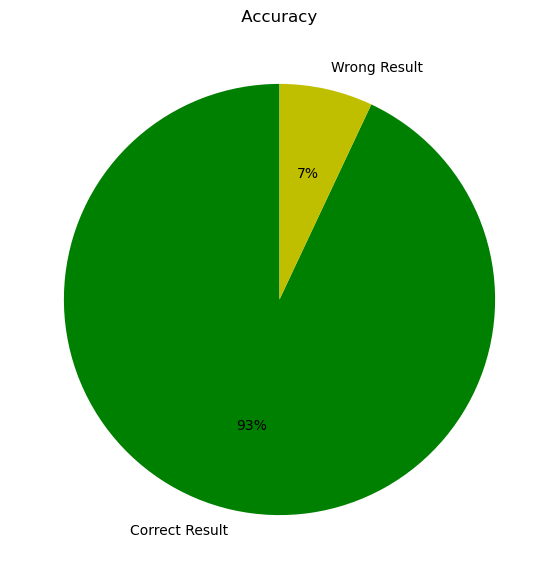

In [346]:
acc = np.round(accuracy_score(y_test, y_pred10)*100)
plt.style.use('default')
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# Random Forest Classifier

In [347]:
RFC = RandomForestClassifier(n_estimators = 250,max_features = 50)
parameters = {'n_estimators': [30, 35, 40, 45], 'max_depth': [4, 5, 6, 7, 8], 'min_impurity_decrease': [0, 0.001, 0.01],
             'criterion': ["gini", "entropy", "log_loss"], 'min_samples_split': [4, 5, 6, 7], 
            'max_features': ["sqrt", "log2", None]
             }
rf_clf=RandomizedSearchCV(RFC, parameters, scoring='accuracy', n_iter=1000)
rf_clf.fit(x_train,y_train)
rf_best = rf_clf.best_params_
print(rf_clf.best_params_)

{'n_estimators': 35, 'min_samples_split': 5, 'min_impurity_decrease': 0.001, 'max_features': 'log2', 'max_depth': 7, 'criterion': 'entropy'}


In [348]:
y_pred11=rf_clf.predict(x_test)
y_pred11

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0.])

In [349]:
get_metrics_results(y_test, y_pred11, verbose = True)

accuracy_score: 0.9666666666666667
roc_auc_score: 0.9642857142857143
precision_score: 1.0
recall_score: 0.9285714285714286
f1_score: 0.962962962962963


[0.9666666666666667,
 0.9642857142857143,
 1.0,
 0.9285714285714286,
 0.962962962962963]

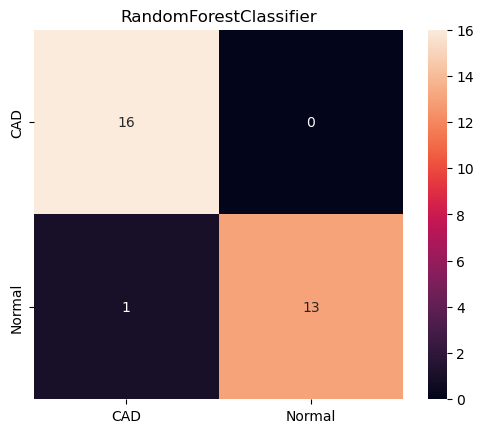

In [350]:
plot_confusion_matrix(y_pred11 , "RandomForestClassifier")

In [351]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred11})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

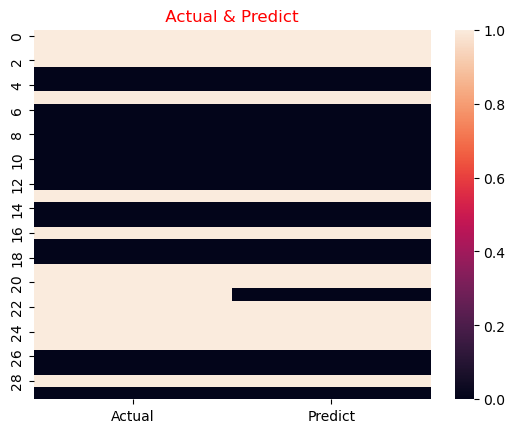

In [352]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a6cb5930>,
 [Text(-0.10351904621929815, -1.095118170367859, 'Correct Result'),
  Text(0.10351895009520744, 1.095118179454248, 'Wrong Result')],
 [Text(-0.05646493430143535, -0.597337183837014, '97%'),
  Text(0.05646488187011314, 0.5973371887932261, '3%')])

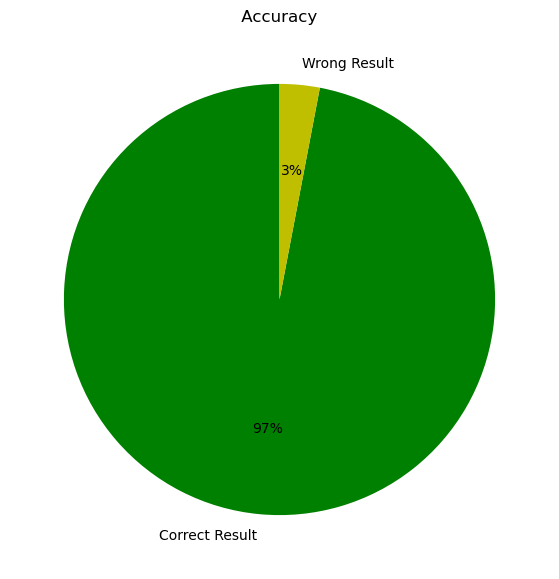

In [353]:
acc = np.round(accuracy_score(y_test, y_pred11)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# KNeighborsClassifier

In [361]:
knn=KNeighborsClassifier()
parameters = {'n_neighbors':[40, 45, 50], 'weights':['uniform', 'distance'], 'metric' : ['minkowski','euclidean','manhattan']}
knn_clf=RandomizedSearchCV(knn, parameters, scoring='f1', n_iter=100)
knn_clf.fit(x_train,y_train)
knn_best = knn_clf.best_params_
print(knn_clf.best_params_)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 18 is smaller than n_iter=100. Running 18 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


{'weights': 'distance', 'n_neighbors': 40, 'metric': 'manhattan'}


In [362]:
y_pred12 = knn_clf.predict(x_test)
y_pred12

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 0., 0.])

In [363]:
get_metrics_results(y_test, y_pred12, verbose = True)

accuracy_score: 0.8666666666666667
roc_auc_score: 0.8571428571428572
precision_score: 1.0
recall_score: 0.7142857142857143
f1_score: 0.8333333333333333


[0.8666666666666667,
 0.8571428571428572,
 1.0,
 0.7142857142857143,
 0.8333333333333333]

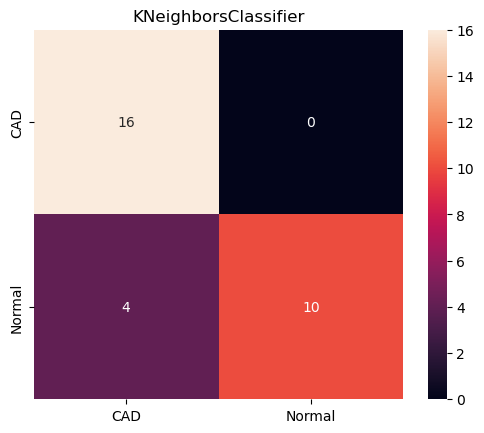

In [364]:
plot_confusion_matrix(y_pred12 , "KNeighborsClassifier")

In [365]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred12})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

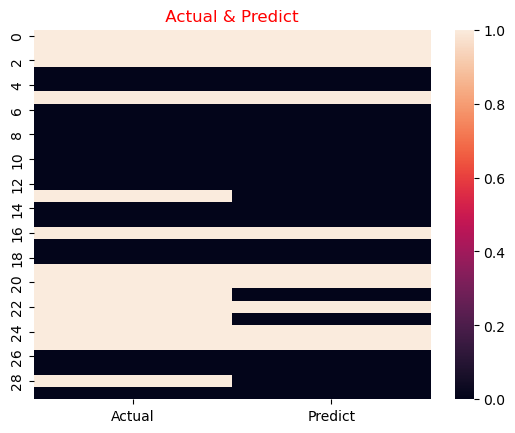

In [366]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a6e394b0>,
 [Text(-0.4368626645752139, -1.0095300947967052, 'Correct Result'),
  Text(0.436862664575214, 1.009530094796705, 'Wrong Result')],
 [Text(-0.23828872613193483, -0.550652778980021, '87%'),
  Text(0.23828872613193489, 0.5506527789800209, '13%')])

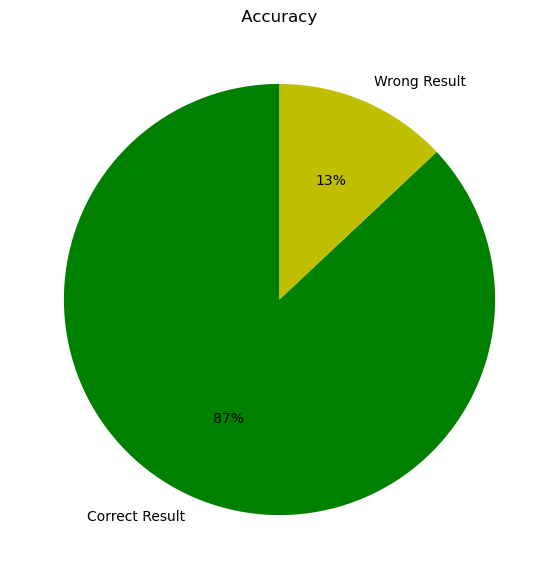

In [367]:
acc = np.round(accuracy_score(y_test, y_pred12)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# XGBoost Classifier (96%)

In [368]:
xgb_classifier = xgb.XGBClassifier(random_state=42)
parameters = {
    'learning_rate': [0.01, 0.02, 0.03, 0.1],
    'n_estimators': [300, 400, 500],
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [0.2, 0.5, 1, 2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [0, 0.1, 0.2, 0.3],
    'alpha': [0, 0.1, 0.2, 0.3]
}
xgb_clf = RandomizedSearchCV(xgb_classifier, parameters, scoring='accuracy', n_iter=250)
xgb_clf.fit(x_train,y_train)
xgb_best = xgb_clf.best_params_
print(xgb_clf.best_params_)

{'subsample': 0.8, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.1, 'lambda': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.8, 'alpha': 0.3}


In [369]:
y_pred13 = xgb_clf.predict(x_test)
y_pred13

array([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 0])

In [370]:
get_metrics_results(y_test, y_pred13, verbose = True)

accuracy_score: 0.9666666666666667
roc_auc_score: 0.9642857142857143
precision_score: 1.0
recall_score: 0.9285714285714286
f1_score: 0.962962962962963


[0.9666666666666667,
 0.9642857142857143,
 1.0,
 0.9285714285714286,
 0.962962962962963]

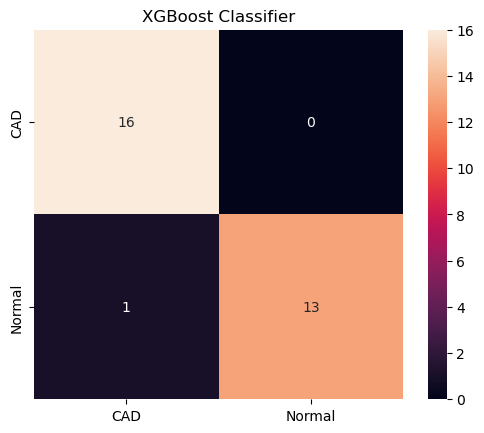

In [371]:
plot_confusion_matrix(y_pred13 , "XGBoost Classifier")

In [372]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred13})
df_comp

,Actual,Predict
0,1.0,1
1,1.0,1
2,1.0,1
3,0.0,0
4,0.0,0
5,1.0,1
6,0.0,0
7,0.0,0
8,0.0,0
9,0.0,0


<Axes: title={'center': ' Actual & Predict '}>

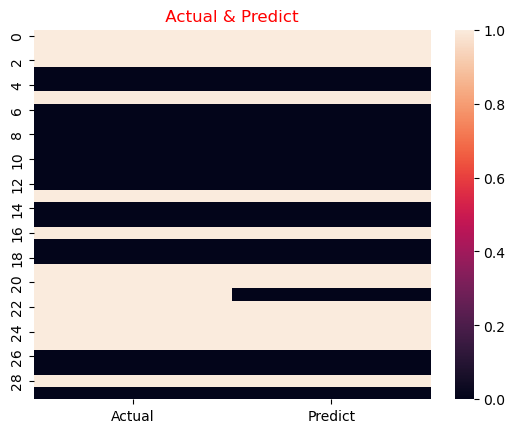

In [373]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a763c2b0>,
 [Text(-0.10351904621929815, -1.095118170367859, 'Correct Result'),
  Text(0.10351895009520744, 1.095118179454248, 'Wrong Result')],
 [Text(-0.05646493430143535, -0.597337183837014, '97%'),
  Text(0.05646488187011314, 0.5973371887932261, '3%')])

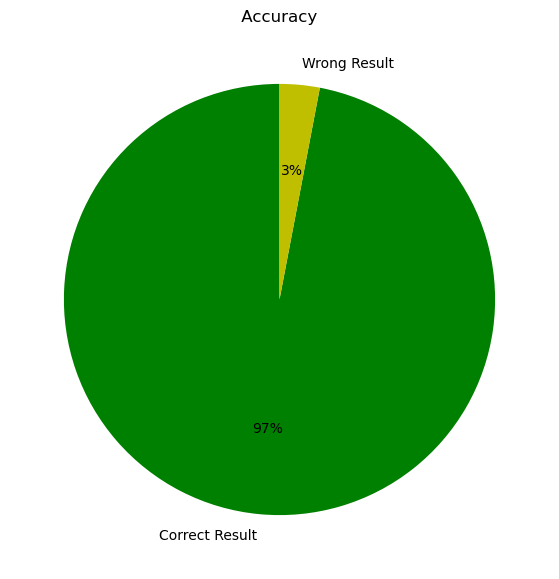

In [374]:
acc = np.round(accuracy_score(y_test, y_pred13)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# CatBoostClassifier

In [375]:
catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)
parameters = {
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'iterations': [50, 100, 200],
    'depth': [3, 4, 5, 6],
    'l2_leaf_reg': [7, 9, 10, 11, 12],
    'border_count': [64, 128, 255],
    'subsample': [0.5, 0.6, 0.7, 1.0],
    'colsample_bylevel': [0.8, 0.9, 1.0],
    'min_data_in_leaf': [2, 4, 6, 10],
    'max_leaves': [15, 31, 63],
    'auto_class_weights': ['None', 'Balanced'],
}
catboost_clf = RandomizedSearchCV(catboost_classifier, parameters, scoring='f1', n_iter=250)
catboost_clf.fit(x_train,y_train)
catboost_best = catboost_clf.best_params_
print(catboost_clf.best_params_)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
810 fits failed out of a total of 1250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
810 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mahmo\anaconda3\lib\site-packages\catboost\core.py", line 5131, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "C:\Users\mahmo\anaconda3\lib\site-packages\catboost\core.py", line 234

{'subsample': 1.0, 'min_data_in_leaf': 2, 'max_leaves': 31, 'learning_rate': 0.2, 'l2_leaf_reg': 12, 'iterations': 50, 'depth': 5, 'colsample_bylevel': 0.8, 'border_count': 255, 'auto_class_weights': 'None'}


In [377]:
y_pred14 = catboost_clf.predict(x_test)
y_pred14

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0.])

In [378]:
get_metrics_results(y_test, y_pred14, verbose = True)

accuracy_score: 0.9333333333333333
roc_auc_score: 0.9285714285714286
precision_score: 1.0
recall_score: 0.8571428571428571
f1_score: 0.923076923076923


[0.9333333333333333,
 0.9285714285714286,
 1.0,
 0.8571428571428571,
 0.923076923076923]

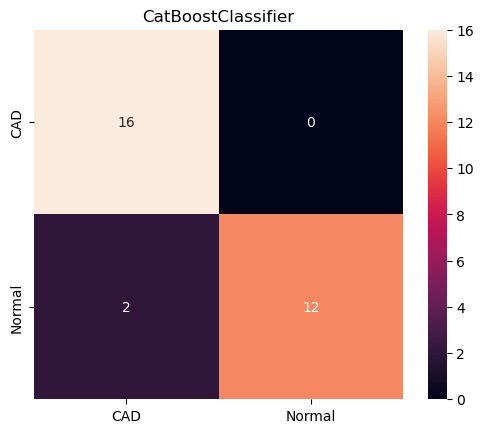

In [379]:
plot_confusion_matrix(y_pred14 , "CatBoostClassifier")

In [380]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred14})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

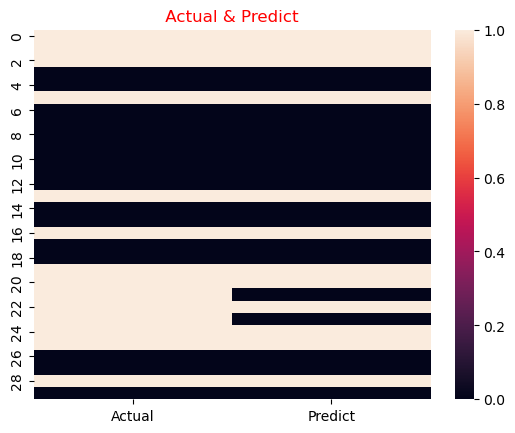

In [381]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a88bbc40>,
 [Text(-0.23995754141400993, -1.0735084435245694, 'Correct Result'),
  Text(0.23995751628673073, 1.0735084491411808, 'Wrong Result')],
 [Text(-0.13088593168036905, -0.5855500601043105, '93%'),
  Text(0.13088591797458038, 0.5855500631679168, '7%')])

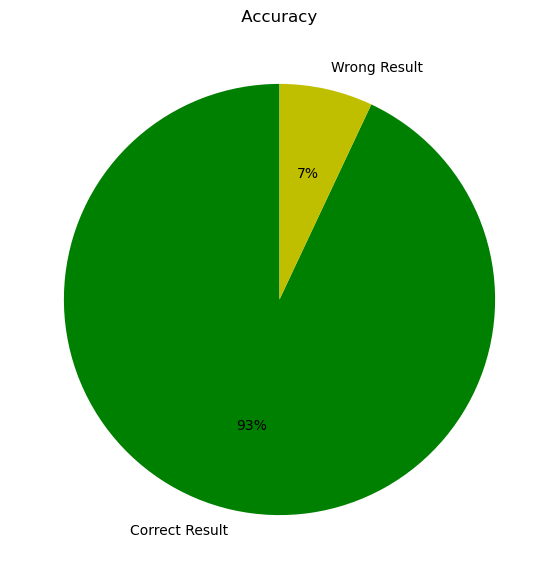

In [382]:
acc = np.round(accuracy_score(y_test, y_pred14)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# AdaBoostClassifier

In [383]:
# Define the base estimator (Decision Tree)
base_estimator = DecisionTreeClassifier(random_state=42)

# Create the AdaBoostClassifier with the base estimator
adaboost_classifier = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Define the parameter space
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'base_estimator__max_depth': [5, 8, 10],
    'base_estimator__min_samples_split': [2, 5, 10],
    'base_estimator__min_samples_leaf': [4, 5, 10],
}

# Create RandomizedSearchCV
adaboost_clf = RandomizedSearchCV(adaboost_classifier, parameters, scoring='f1', n_iter=250)
adaboost_clf.fit(x_train,y_train)

# Access the best parameters
adaboost_best = adaboost_clf.best_params_
print(adaboost_best)

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-p

C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\mahmo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


{'n_estimators': 50, 'learning_rate': 0.02, 'base_estimator__min_samples_split': 10, 'base_estimator__min_samples_leaf': 4, 'base_estimator__max_depth': 10}


In [384]:
y_pred15 = adaboost_clf.predict(x_test)
y_pred15

array([0., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0.])

In [385]:
y_test

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0.])

In [386]:
get_metrics_results(y_test, y_pred15, verbose = True)

accuracy_score: 0.8666666666666667
roc_auc_score: 0.8616071428571428
precision_score: 0.9166666666666666
recall_score: 0.7857142857142857
f1_score: 0.8461538461538461


[0.8666666666666667,
 0.8616071428571428,
 0.9166666666666666,
 0.7857142857142857,
 0.8461538461538461]

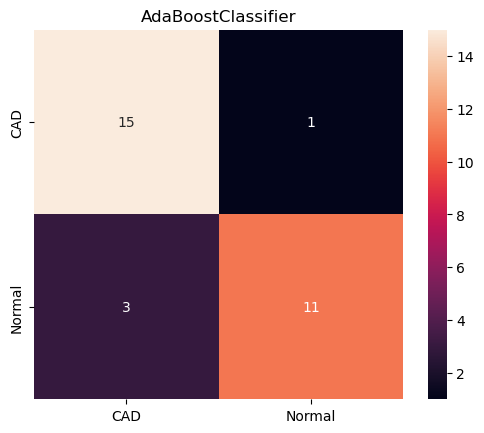

In [387]:
plot_confusion_matrix(y_pred15 , "AdaBoostClassifier")

In [388]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred15})
df_comp

,Actual,Predict
0,1.0,0.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

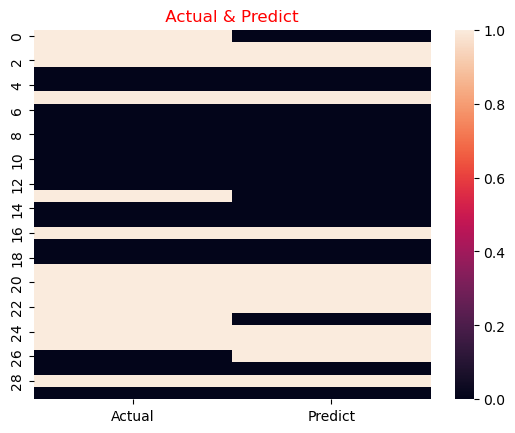

In [389]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)

([<matplotlib.patches.Wedge at 0x245a6c906d0>,
 [Text(-0.4368626645752139, -1.0095300947967052, 'Correct Result'),
  Text(0.436862664575214, 1.009530094796705, 'Wrong Result')],
 [Text(-0.23828872613193483, -0.550652778980021, '87%'),
  Text(0.23828872613193489, 0.5506527789800209, '13%')])

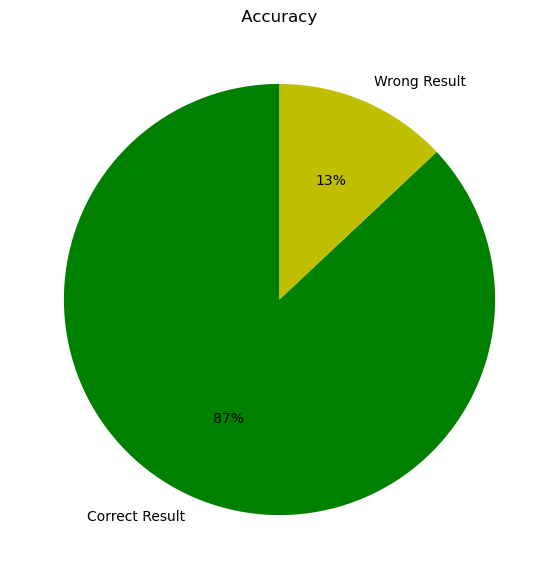

In [390]:
acc = np.round(accuracy_score(y_test, y_pred15)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

# LGBMClassifier

In [391]:
LGB = LGBMClassifier(random_state=42)
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'base_estimator__max_depth': [5, 8, 10],
    'base_estimator__min_samples_split': [2, 5, 10],
    'base_estimator__min_samples_leaf': [4, 5, 10],
}
LGB_clf = RandomizedSearchCV(LGB, parameters, scoring='f1', n_iter=250)
LGB_clf.fit(x_train,y_train)

# Access the best parameters
LGB_best = LGB_clf.best_params_
print(LGB_best)

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_leaf
[LightGBM] [Warning] Unknown parameter: base_estimator__max_depth
[LightGBM] [Warning] Unknown parameter: base_estimator__min_samples_split
[LightGB

In [392]:
y_pred16 = LGB_clf.predict(x_test)
y_pred16

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0.])

In [393]:
y_test

array([1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0.])

In [394]:
get_metrics_results(y_test, y_pred16, verbose = True)

accuracy_score: 0.9333333333333333
roc_auc_score: 0.9285714285714286
precision_score: 1.0
recall_score: 0.8571428571428571
f1_score: 0.923076923076923


[0.9333333333333333,
 0.9285714285714286,
 1.0,
 0.8571428571428571,
 0.923076923076923]

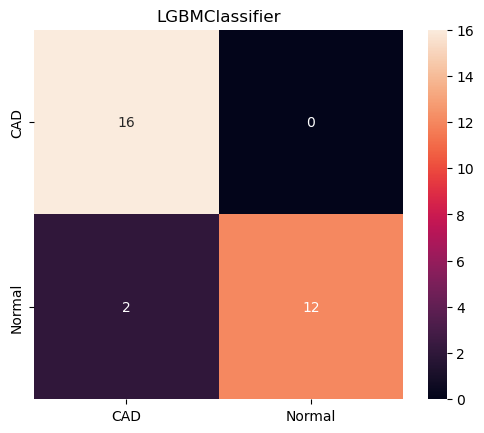

In [395]:
plot_confusion_matrix(y_pred16 , "LGBMClassifier")

In [396]:
df_comp = pd.DataFrame({'Actual':y_test , 'Predict':y_pred16})
df_comp

,Actual,Predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,0.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


<Axes: title={'center': ' Actual & Predict '}>

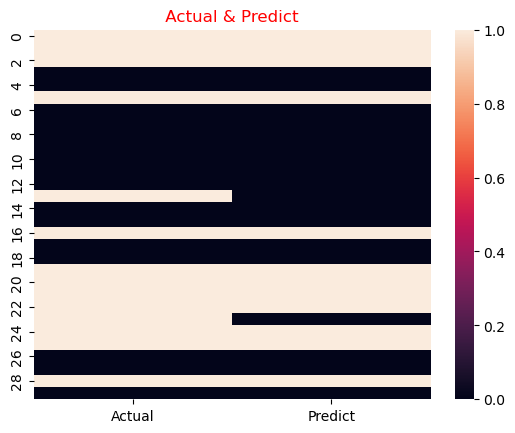

In [397]:
plt.title (' Actual & Predict ',color = 'r')
sns.heatmap(df_comp)


([<matplotlib.patches.Wedge at 0x245a45c3730>,
 [Text(-0.23995754141400993, -1.0735084435245694, 'Correct Result'),
  Text(0.23995751628673073, 1.0735084491411808, 'Wrong Result')],
 [Text(-0.13088593168036905, -0.5855500601043105, '93%'),
  Text(0.13088591797458038, 0.5855500631679168, '7%')])

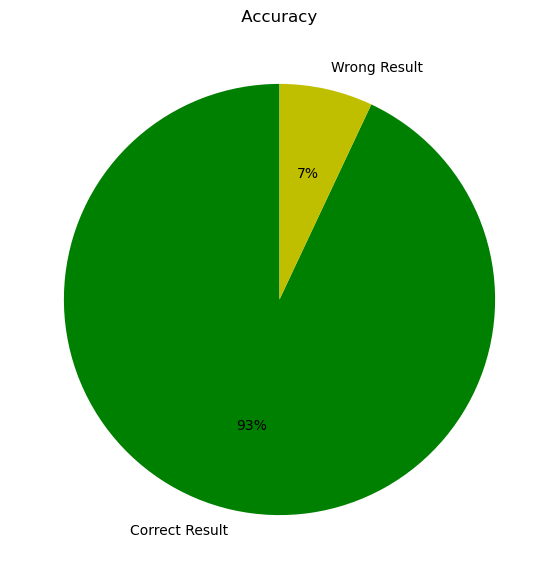

In [398]:
acc = np.round(accuracy_score(y_test, y_pred16)*100)
plt.figure(figsize=(12,7))
data = [acc,100-acc]
names = ['Correct Result','Wrong Result']
plt.title (' Accuracy ',color = 'black')
plt.pie (data,labels = names,labeldistance = 1.1,startangle = 90,colors = ['g','y'],autopct = '%1.0f%%',)

In [400]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    train_acc = model.score(X_train, y_train)
    test_acc = model.score(X_test, y_test)
    y_pred = model.predict(X_test)
    return train_acc, test_acc, y_pred

models = [
    LogisticRegression(),
    SVC(),
    KNeighborsClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    CatBoostClassifier(),
    AdaBoostClassifier(),
    LGBMClassifier(),
]

model_names = ["Logistic Regression", "SVC","KNeighbors Classifier", "Random Forest", "XGBoost", "CatBoost", "AdaBoost", "Light GBM"]
train_results = []
test_results = []

for model in models:
    train_acc, test_acc, y_pred = evaluate_model(model, x_train, y_train, x_test, y_test)
    train_results.append(train_acc)
    test_results.append(test_acc)

Learning rate set to 0.005815
0:	learn: 0.6841462	total: 4.11ms	remaining: 4.11s
1:	learn: 0.6751067	total: 7.56ms	remaining: 3.77s
2:	learn: 0.6670835	total: 10.7ms	remaining: 3.54s
3:	learn: 0.6594137	total: 13.5ms	remaining: 3.37s
4:	learn: 0.6501125	total: 16.7ms	remaining: 3.32s
5:	learn: 0.6415485	total: 20.1ms	remaining: 3.33s
6:	learn: 0.6346672	total: 23ms	remaining: 3.27s
7:	learn: 0.6268122	total: 26.1ms	remaining: 3.23s
8:	learn: 0.6181859	total: 29.1ms	remaining: 3.2s
9:	learn: 0.6104829	total: 32.1ms	remaining: 3.18s
10:	learn: 0.6022343	total: 35.1ms	remaining: 3.15s
11:	learn: 0.5942334	total: 38.1ms	remaining: 3.14s
12:	learn: 0.5876358	total: 40.9ms	remaining: 3.11s
13:	learn: 0.5804541	total: 43.8ms	remaining: 3.08s
14:	learn: 0.5739417	total: 46.9ms	remaining: 3.08s
15:	learn: 0.5672756	total: 49.9ms	remaining: 3.07s
16:	learn: 0.5607511	total: 53ms	remaining: 3.06s
17:	learn: 0.5539843	total: 55.9ms	remaining: 3.05s
18:	learn: 0.5477994	total: 59ms	remaining: 3.04s

210:	learn: 0.1030103	total: 583ms	remaining: 2.18s
211:	learn: 0.1023058	total: 586ms	remaining: 2.18s
212:	learn: 0.1016733	total: 589ms	remaining: 2.18s
213:	learn: 0.1010047	total: 592ms	remaining: 2.17s
214:	learn: 0.1002019	total: 595ms	remaining: 2.17s
215:	learn: 0.0997012	total: 598ms	remaining: 2.17s
216:	learn: 0.0990918	total: 601ms	remaining: 2.17s
217:	learn: 0.0985302	total: 604ms	remaining: 2.16s
218:	learn: 0.0978644	total: 606ms	remaining: 2.16s
219:	learn: 0.0973427	total: 609ms	remaining: 2.16s
220:	learn: 0.0967805	total: 612ms	remaining: 2.16s
221:	learn: 0.0960264	total: 614ms	remaining: 2.15s
222:	learn: 0.0953068	total: 617ms	remaining: 2.15s
223:	learn: 0.0949447	total: 620ms	remaining: 2.15s
224:	learn: 0.0943281	total: 622ms	remaining: 2.14s
225:	learn: 0.0936885	total: 625ms	remaining: 2.14s
226:	learn: 0.0930634	total: 628ms	remaining: 2.14s
227:	learn: 0.0926845	total: 631ms	remaining: 2.13s
228:	learn: 0.0919428	total: 635ms	remaining: 2.14s
229:	learn: 

429:	learn: 0.0375645	total: 1.19s	remaining: 1.58s
430:	learn: 0.0375025	total: 1.19s	remaining: 1.57s
431:	learn: 0.0373885	total: 1.2s	remaining: 1.57s
432:	learn: 0.0372805	total: 1.2s	remaining: 1.57s
433:	learn: 0.0371824	total: 1.2s	remaining: 1.57s
434:	learn: 0.0371213	total: 1.21s	remaining: 1.57s
435:	learn: 0.0369920	total: 1.21s	remaining: 1.56s
436:	learn: 0.0368429	total: 1.21s	remaining: 1.56s
437:	learn: 0.0366771	total: 1.22s	remaining: 1.56s
438:	learn: 0.0364867	total: 1.22s	remaining: 1.56s
439:	learn: 0.0364047	total: 1.22s	remaining: 1.55s
440:	learn: 0.0362950	total: 1.22s	remaining: 1.55s
441:	learn: 0.0361152	total: 1.23s	remaining: 1.55s
442:	learn: 0.0360244	total: 1.23s	remaining: 1.55s
443:	learn: 0.0358255	total: 1.23s	remaining: 1.54s
444:	learn: 0.0356777	total: 1.24s	remaining: 1.54s
445:	learn: 0.0356057	total: 1.24s	remaining: 1.54s
446:	learn: 0.0355729	total: 1.24s	remaining: 1.53s
447:	learn: 0.0354596	total: 1.24s	remaining: 1.53s
448:	learn: 0.0

641:	learn: 0.0210336	total: 1.79s	remaining: 1s
642:	learn: 0.0209806	total: 1.8s	remaining: 998ms
643:	learn: 0.0209448	total: 1.8s	remaining: 995ms
644:	learn: 0.0208583	total: 1.8s	remaining: 992ms
645:	learn: 0.0207994	total: 1.8s	remaining: 989ms
646:	learn: 0.0207541	total: 1.81s	remaining: 986ms
647:	learn: 0.0207084	total: 1.81s	remaining: 984ms
648:	learn: 0.0206421	total: 1.81s	remaining: 981ms
649:	learn: 0.0205697	total: 1.82s	remaining: 978ms
650:	learn: 0.0205147	total: 1.82s	remaining: 975ms
651:	learn: 0.0204642	total: 1.82s	remaining: 972ms
652:	learn: 0.0204366	total: 1.82s	remaining: 969ms
653:	learn: 0.0203989	total: 1.83s	remaining: 967ms
654:	learn: 0.0203731	total: 1.83s	remaining: 964ms
655:	learn: 0.0203258	total: 1.83s	remaining: 961ms
656:	learn: 0.0202590	total: 1.83s	remaining: 958ms
657:	learn: 0.0201968	total: 1.84s	remaining: 955ms
658:	learn: 0.0201676	total: 1.84s	remaining: 952ms
659:	learn: 0.0201141	total: 1.84s	remaining: 949ms
660:	learn: 0.02005

860:	learn: 0.0133168	total: 2.4s	remaining: 387ms
861:	learn: 0.0132914	total: 2.4s	remaining: 384ms
862:	learn: 0.0132439	total: 2.4s	remaining: 382ms
863:	learn: 0.0132266	total: 2.41s	remaining: 379ms
864:	learn: 0.0131910	total: 2.41s	remaining: 376ms
865:	learn: 0.0131675	total: 2.41s	remaining: 373ms
866:	learn: 0.0131351	total: 2.42s	remaining: 371ms
867:	learn: 0.0130974	total: 2.42s	remaining: 368ms
868:	learn: 0.0130768	total: 2.42s	remaining: 365ms
869:	learn: 0.0130405	total: 2.42s	remaining: 362ms
870:	learn: 0.0130126	total: 2.43s	remaining: 360ms
871:	learn: 0.0129801	total: 2.43s	remaining: 357ms
872:	learn: 0.0129540	total: 2.43s	remaining: 354ms
873:	learn: 0.0129262	total: 2.44s	remaining: 351ms
874:	learn: 0.0128989	total: 2.44s	remaining: 348ms
875:	learn: 0.0128900	total: 2.44s	remaining: 346ms
876:	learn: 0.0128653	total: 2.44s	remaining: 343ms
877:	learn: 0.0128389	total: 2.45s	remaining: 340ms
878:	learn: 0.0128140	total: 2.45s	remaining: 337ms
879:	learn: 0.0

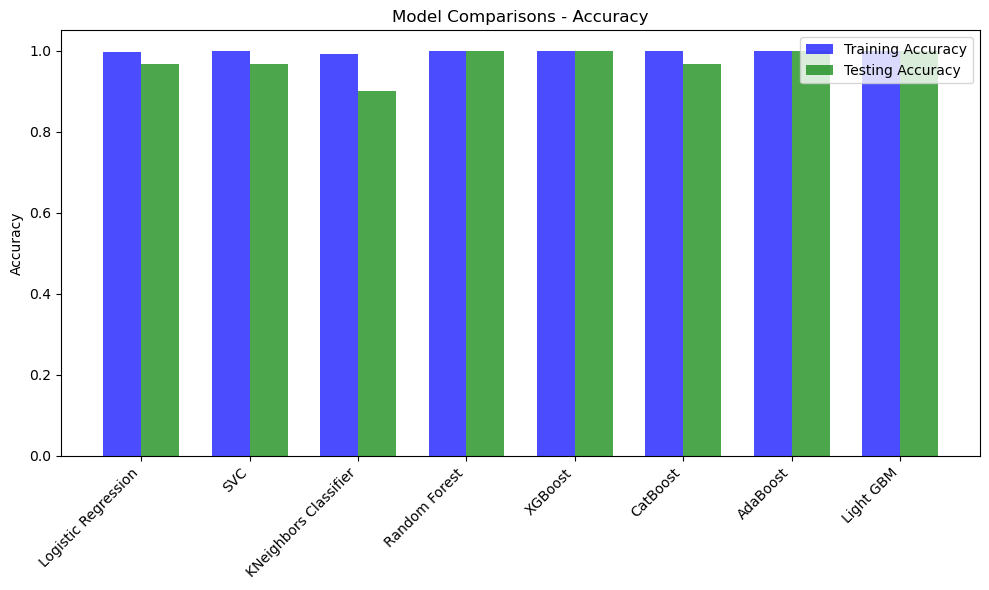

In [409]:
# Plot model performance
plt.figure(figsize=(10, 6))
width = 0.35  # the width of the bars
plt.bar([i - width/2 for i in range(len(model_names))], train_results, width, alpha=0.7, label="Training Accuracy", color='b')
plt.bar([i + width/2 for i in range(len(model_names))], test_results, width, alpha=0.7, label="Testing Accuracy", color='g')
plt.ylabel("Accuracy")
plt.xticks(range(len(model_names)), model_names, rotation=45, ha="right")
plt.legend()
plt.title("Model Comparisons - Accuracy")
plt.tight_layout()
plt.show()

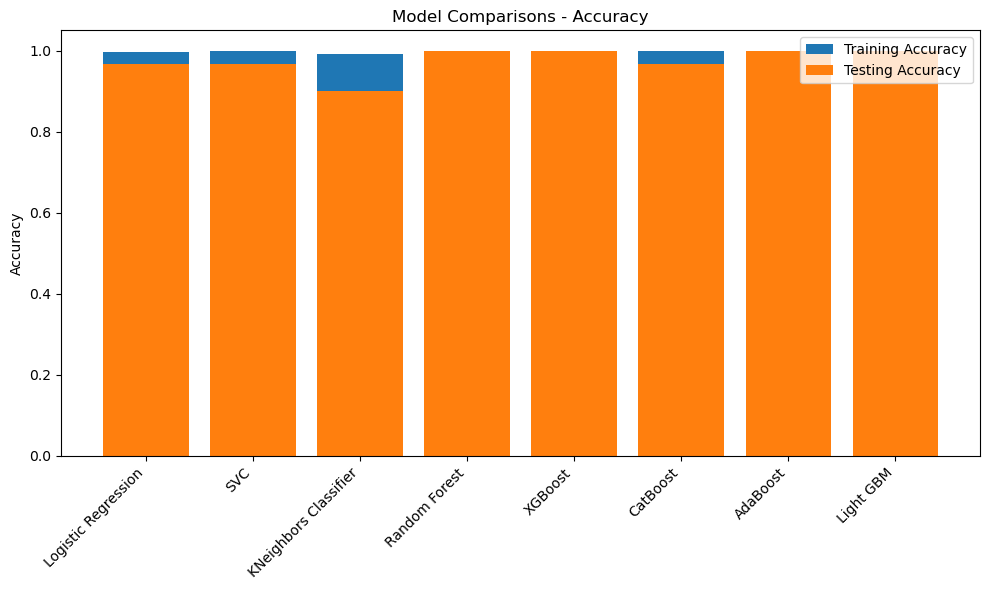

In [408]:
# Plot model performance
plt.figure(figsize=(10, 6))
plt.bar(model_names, train_results, alpha=1, label="Training Accuracy")
plt.bar(model_names, test_results, alpha=1, label="Testing Accuracy")
plt.ylabel("Accuracy")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.title("Model Comparisons - Accuracy")
plt.tight_layout()
plt.show()

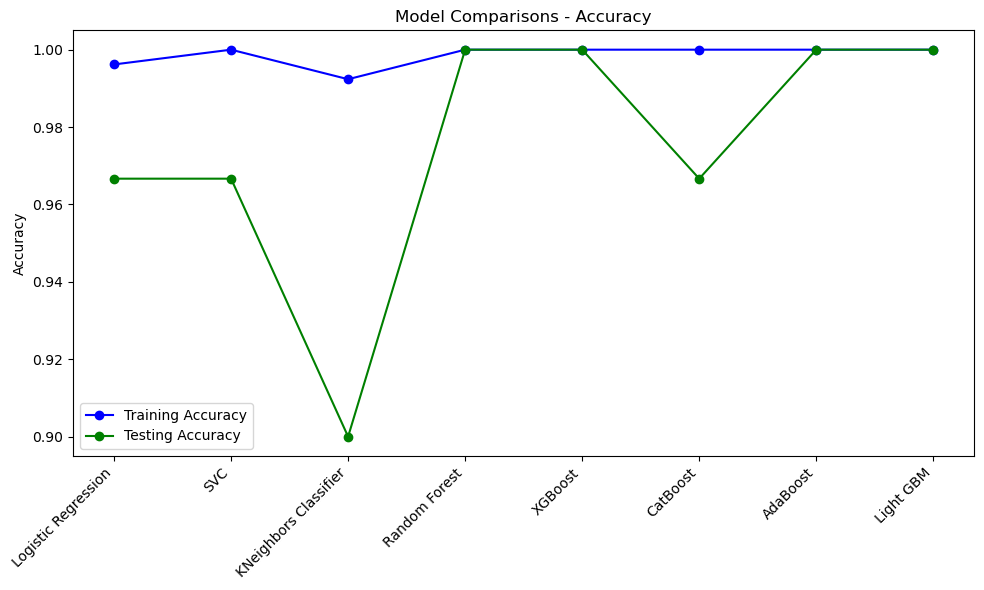

In [402]:
# Plot model performance
plt.figure(figsize=(10, 6))
plt.plot(model_names, train_results, marker='o', label="Training Accuracy", linestyle='-', color='b')
plt.plot(model_names, test_results, marker='o', label="Testing Accuracy", linestyle='-', color='g')
plt.ylabel("Accuracy")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.title("Model Comparisons - Accuracy")
plt.tight_layout()
plt.show()